# Bibliotecas Usadas:

In [2]:
# Bibliotecas Usadas:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import load_iris
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import (roc_curve, auc, roc_auc_score)
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, confusion_matrix)
import seaborn as sns
from scipy.stats import norm
from scipy import stats
import math
from io import StringIO
import seaborn as sns

# A ) Aplicação de técnicas de aprendizado de máquina no dataset escolhido


---



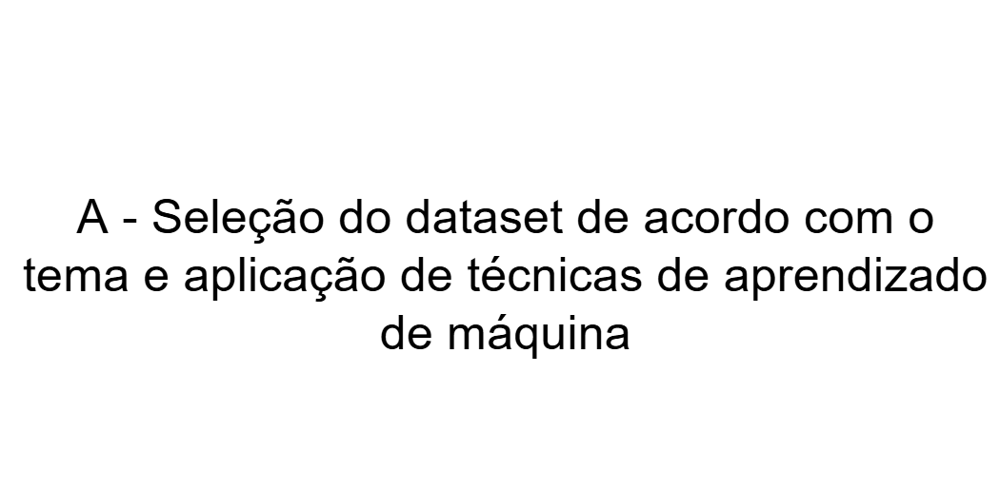

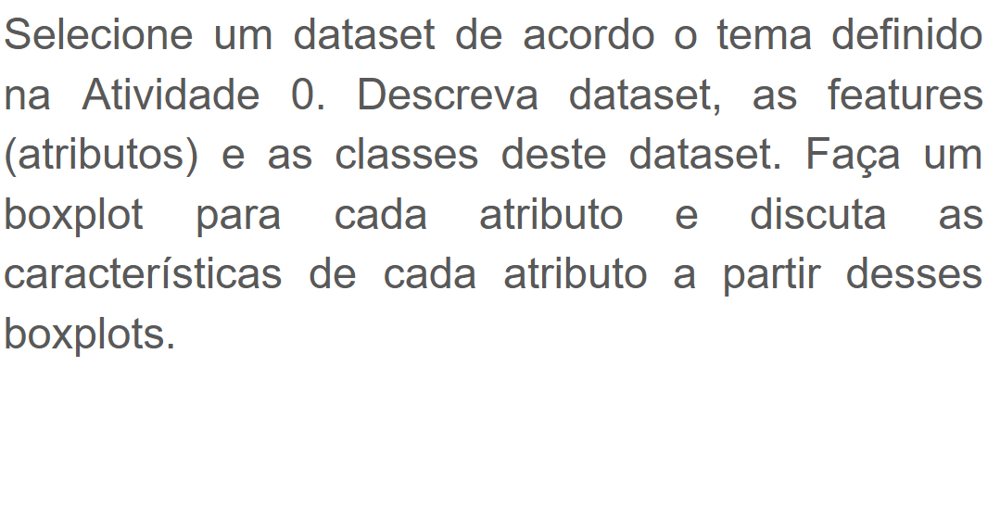

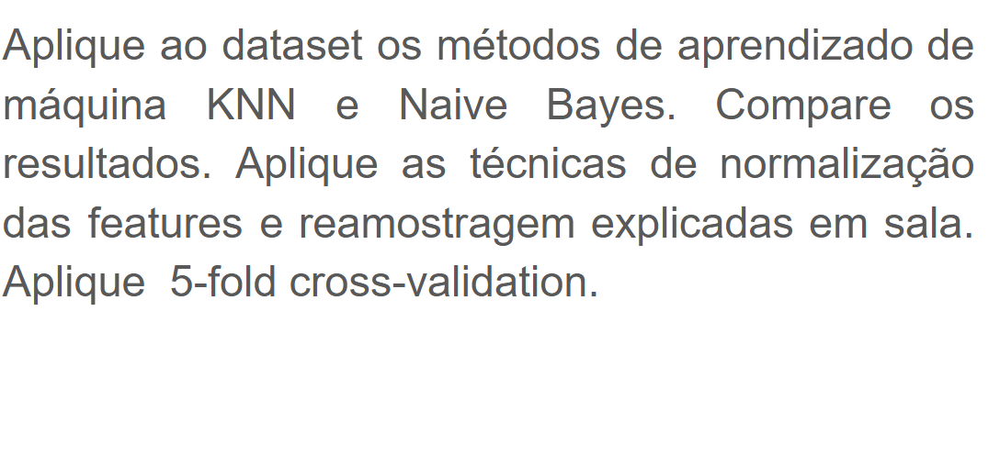

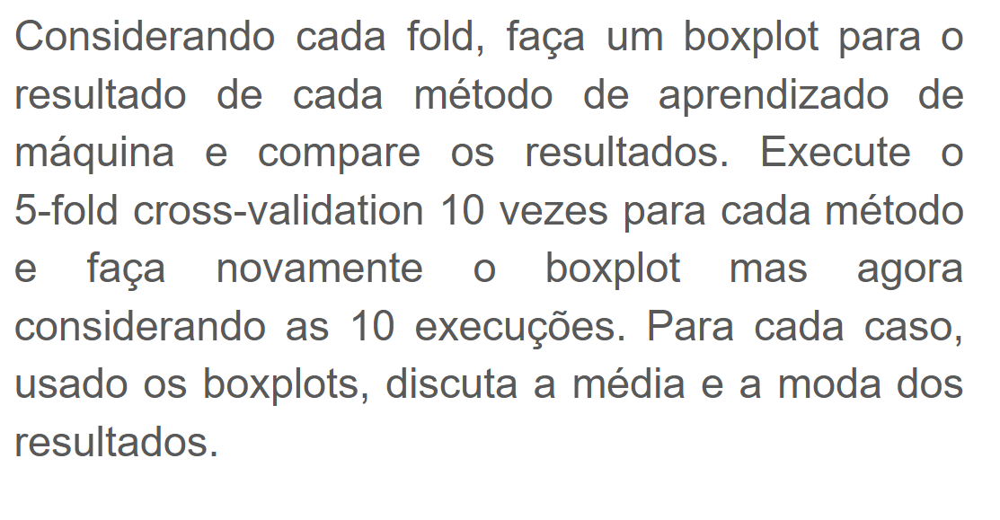

### Detalhes do Dataset:
O dataset contém características de três tipos diferentes de trigo, cada variedade de trigo teve 70 coletas de dados para medições.

As varidades de trigo (não são espécies de trigo) são as seguintes:

- Canadian: Trigo originário e típico do Canadá (geralmente da espécie Triticum aestivum). É muito reconhecido mundialmente pela sua alta qualidade e teor de proteínas.

- Kama: Variedade frequentemente utilizada em bancos de dados agronômicos e de classificação para representar um tipo morfológico específico de grão de trigo.

- Rosa: Outra variedade clássica de trigo frequentemente categorizada junto com Kama e Canadian em estudos botânicos e experimentos de classificação de sementes.

Features:

As features são sete características geométricas presentes nessas variedades de grão de trigo. Elas são as seguintes:

- Área (A): tamanho da superficie dos grãos.
- Perímetro (P): Se trata do comprimento da borda do grão
- Compacidade: É a medida do quão compacto é o grão.
- Comprimento do grão: O tamanho do grão em seu eixo maior.
- Largura do grão: É a espessura do grão no seu eixo menor.
- Coeficiente de Asssimetria: Mede o quão simétrico é o grão.
- Comprimento da Ranhura do Grão: Mede o comprimento da ranhura dos grãos.

A fórmula de cálculo da features é:

Área:
$$
A = \sum \text{quantidade de pixels pertencentes ao grão.}
$$

Compacidade:
$$
C = \frac{4 \pi A}{P^2}
$$

Perímetro:
$$
P = \sum \text{comprimento da borda}
$$

Comprimento do Grão:
$$
L = \max(d)
$$

Largura do Grão:
$$
W = \min(d)
$$

Coeficiente de Assimetria:
$$
\text{Assimetria} =
\frac{1}{n}
\sum
\left(
\frac{x_i - \mu}{\sigma}
\right)^3
$$

Comprimento da Ranhura:
$$
G = \text{comprimento do sulco central}
$$



$ $

Classes:

As classes foram divididas em $1$, $2$, $3$. Elas estão na seguinte ordem: $[Kama, Rosa, Canadian ]$

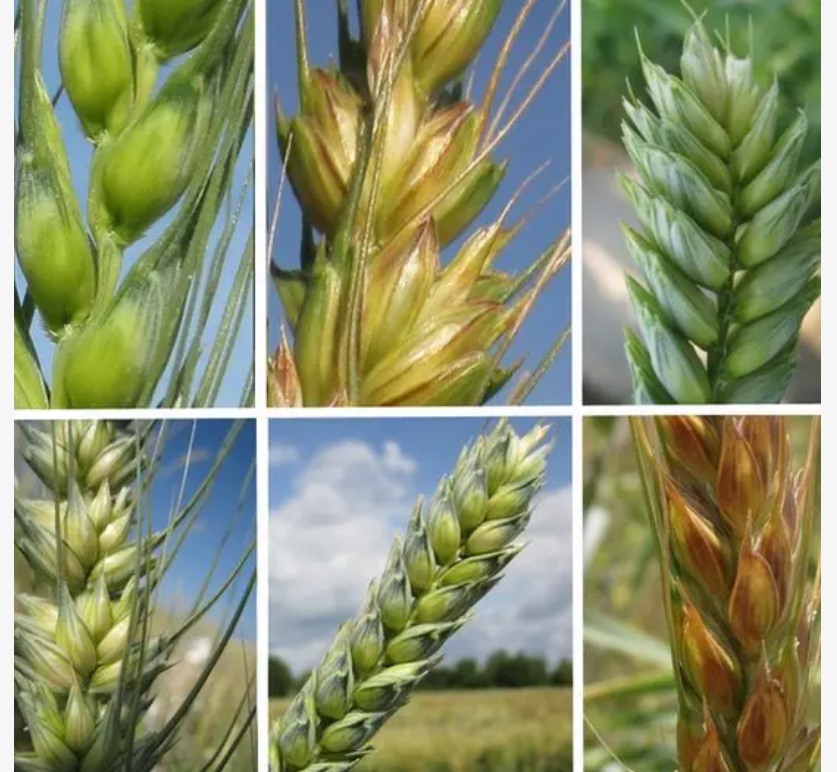

imagem ilustrativa.

In [3]:
dataset_seeds = """
ID,area,perimeter,compactness,lengthOfKernel,widthOfKernel,asymmetryCoefficient,lengthOfKernelGroove,seedType
1,15.26,14.84,0.871,5.763,3.312,2.221,5.22,1
2,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,1
3,14.29,14.09,0.905,5.291,3.337,2.699,4.825,1
4,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,1
5,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,1
6,14.38,14.21,0.8951,5.386,3.312,2.462,4.956,1
7,14.69,14.49,0.8799,5.563,3.259,3.586,5.219,1
8,14.11,14.1,0.8911,5.42,3.302,2.7,5,1
9,16.63,15.46,0.8747,6.053,3.465,2.04,5.877,1
10,16.44,15.25,0.888,5.884,3.505,1.969,5.533,1
11,15.26,14.85,0.8696,5.714,3.242,4.543,5.314,1
12,14.03,14.16,0.8796,5.438,3.201,1.717,5.001,1
13,13.89,14.02,0.888,5.439,3.199,3.986,4.738,1
14,13.78,14.06,0.8759,5.479,3.156,3.136,4.872,1
15,13.74,14.05,0.8744,5.482,3.114,2.932,4.825,1
16,14.59,14.28,0.8993,5.351,3.333,4.185,4.781,1
17,13.99,13.83,0.9183,5.119,3.383,5.234,4.781,1
18,15.69,14.75,0.9058,5.527,3.514,1.599,5.046,1
19,14.7,14.21,0.9153,5.205,3.466,1.767,4.649,1
20,12.72,13.57,0.8686,5.226,3.049,4.102,4.914,1
21,14.16,14.4,0.8584,5.658,3.129,3.072,5.176,1
22,14.11,14.26,0.8722,5.52,3.168,2.688,5.219,1
23,15.88,14.9,0.8988,5.618,3.507,0.7651,5.091,1
24,12.08,13.23,0.8664,5.099,2.936,1.415,4.961,1
25,15.01,14.76,0.8657,5.789,3.245,1.791,5.001,1
26,16.19,15.16,0.8849,5.833,3.421,0.903,5.307,1
27,13.02,13.76,0.8641,5.395,3.026,3.373,4.825,1
28,12.74,13.67,0.8564,5.395,2.956,2.504,4.869,1
29,14.11,14.18,0.882,5.541,3.221,2.754,5.038,1
30,13.45,14.02,0.8604,5.516,3.065,3.531,5.097,1
31,13.16,13.82,0.8662,5.454,2.975,0.8551,5.056,1
32,15.49,14.94,0.8724,5.757,3.371,3.412,5.228,1
33,14.09,14.41,0.8529,5.717,3.186,3.92,5.299,1
34,13.94,14.17,0.8728,5.585,3.15,2.124,5.012,1
35,15.05,14.68,0.8779,5.712,3.328,2.129,5.36,1
36,16.12,15,0.9,5.709,3.485,2.27,5.443,1
37,16.2,15.27,0.8734,5.826,3.464,2.823,5.527,1
38,17.08,15.38,0.9079,5.832,3.683,2.956,5.484,1
39,14.8,14.52,0.8823,5.656,3.288,3.112,5.309,1
40,14.28,14.17,0.8944,5.397,3.298,6.685,5.001,1
41,13.54,13.85,0.8871,5.348,3.156,2.587,5.178,1
42,13.5,13.85,0.8852,5.351,3.158,2.249,5.176,1
43,13.16,13.55,0.9009,5.138,3.201,2.461,4.783,1
44,15.5,14.86,0.882,5.877,3.396,4.711,5.528,1
45,15.11,14.54,0.8986,5.579,3.462,3.128,5.18,1
46,13.8,14.04,0.8794,5.376,3.155,1.56,4.961,1
47,15.36,14.76,0.8861,5.701,3.393,1.367,5.132,1
48,14.99,14.56,0.8883,5.57,3.377,2.958,5.175,1
49,14.79,14.52,0.8819,5.545,3.291,2.704,5.111,1
50,14.86,14.67,0.8676,5.678,3.258,2.129,5.351,1
51,14.43,14.4,0.8751,5.585,3.272,3.975,5.144,1
52,15.78,14.91,0.8923,5.674,3.434,5.593,5.136,1
53,14.49,14.61,0.8538,5.715,3.113,4.116,5.396,1
54,14.33,14.28,0.8831,5.504,3.199,3.328,5.224,1
55,14.52,14.6,0.8557,5.741,3.113,1.481,5.487,1
56,15.03,14.77,0.8658,5.702,3.212,1.933,5.439,1
57,14.46,14.35,0.8818,5.388,3.377,2.802,5.044,1
58,14.92,14.43,0.9006,5.384,3.412,1.142,5.088,1
59,15.38,14.77,0.8857,5.662,3.419,1.999,5.222,1
60,12.11,13.47,0.8392,5.159,3.032,1.502,4.519,1
61,11.42,12.86,0.8683,5.008,2.85,2.7,4.607,1
62,11.23,12.63,0.884,4.902,2.879,2.269,4.703,1
63,12.36,13.19,0.8923,5.076,3.042,3.22,4.605,1
64,13.22,13.84,0.868,5.395,3.07,4.157,5.088,1
65,12.78,13.57,0.8716,5.262,3.026,1.176,4.782,1
66,12.88,13.5,0.8879,5.139,3.119,2.352,4.607,1
67,14.34,14.37,0.8726,5.63,3.19,1.313,5.15,1
68,14.01,14.29,0.8625,5.609,3.158,2.217,5.132,1
69,14.37,14.39,0.8726,5.569,3.153,1.464,5.3,1
70,12.73,13.75,0.8458,5.412,2.882,3.533,5.067,1
71,17.63,15.98,0.8673,6.191,3.561,4.076,6.06,2
72,16.84,15.67,0.8623,5.998,3.484,4.675,5.877,2
73,17.26,15.73,0.8763,5.978,3.594,4.539,5.791,2
74,19.11,16.26,0.9081,6.154,3.93,2.936,6.079,2
75,16.82,15.51,0.8786,6.017,3.486,4.004,5.841,2
76,16.77,15.62,0.8638,5.927,3.438,4.92,5.795,2
77,17.32,15.91,0.8599,6.064,3.403,3.824,5.922,2
78,20.71,17.23,0.8763,6.579,3.814,4.451,6.451,2
79,18.94,16.49,0.875,6.445,3.639,5.064,6.362,2
80,17.12,15.55,0.8892,5.85,3.566,2.858,5.746,2
81,16.53,15.34,0.8823,5.875,3.467,5.532,5.88,2
82,18.72,16.19,0.8977,6.006,3.857,5.324,5.879,2
83,20.2,16.89,0.8894,6.285,3.864,5.173,6.187,2
84,19.57,16.74,0.8779,6.384,3.772,1.472,6.273,2
85,19.51,16.71,0.878,6.366,3.801,2.962,6.185,2
86,18.27,16.09,0.887,6.173,3.651,2.443,6.197,2
87,18.88,16.26,0.8969,6.084,3.764,1.649,6.109,2
88,18.98,16.66,0.859,6.549,3.67,3.691,6.498,2
89,21.18,17.21,0.8989,6.573,4.033,5.78,6.231,2
90,20.88,17.05,0.9031,6.45,4.032,5.016,6.321,2
91,20.1,16.99,0.8746,6.581,3.785,1.955,6.449,2
92,18.76,16.2,0.8984,6.172,3.796,3.12,6.053,2
93,18.81,16.29,0.8906,6.272,3.693,3.237,6.053,2
94,18.59,16.05,0.9066,6.037,3.86,6.001,5.877,2
95,18.36,16.52,0.8452,6.666,3.485,4.933,6.448,2
96,16.87,15.65,0.8648,6.139,3.463,3.696,5.967,2
97,19.31,16.59,0.8815,6.341,3.81,3.477,6.238,2
98,18.98,16.57,0.8687,6.449,3.552,2.144,6.453,2
99,18.17,16.26,0.8637,6.271,3.512,2.853,6.273,2
100,18.72,16.34,0.881,6.219,3.684,2.188,6.097,2
101,16.41,15.25,0.8866,5.718,3.525,4.217,5.618,2
102,17.99,15.86,0.8992,5.89,3.694,2.068,5.837,2
103,19.46,16.5,0.8985,6.113,3.892,4.308,6.009,2
104,19.18,16.63,0.8717,6.369,3.681,3.357,6.229,2
105,18.95,16.42,0.8829,6.248,3.755,3.368,6.148,2
106,18.83,16.29,0.8917,6.037,3.786,2.553,5.879,2
107,18.85,16.17,0.9056,6.152,3.806,2.843,6.2,2
108,17.63,15.86,0.88,6.033,3.573,3.747,5.929,2
109,19.94,16.92,0.8752,6.675,3.763,3.252,6.55,2
110,18.55,16.22,0.8865,6.153,3.674,1.738,5.894,2
111,18.45,16.12,0.8921,6.107,3.769,2.235,5.794,2
112,19.38,16.72,0.8716,6.303,3.791,3.678,5.965,2
113,19.13,16.31,0.9035,6.183,3.902,2.109,5.924,2
114,19.14,16.61,0.8722,6.259,3.737,6.682,6.053,2
115,20.97,17.25,0.8859,6.563,3.991,4.677,6.316,2
116,19.06,16.45,0.8854,6.416,3.719,2.248,6.163,2
117,18.96,16.2,0.9077,6.051,3.897,4.334,5.75,2
118,19.15,16.45,0.889,6.245,3.815,3.084,6.185,2
119,18.89,16.23,0.9008,6.227,3.769,3.639,5.966,2
120,20.03,16.9,0.8811,6.493,3.857,3.063,6.32,2
121,20.24,16.91,0.8897,6.315,3.962,5.901,6.188,2
122,18.14,16.12,0.8772,6.059,3.563,3.619,6.011,2
123,16.17,15.38,0.8588,5.762,3.387,4.286,5.703,2
124,18.43,15.97,0.9077,5.98,3.771,2.984,5.905,2
125,15.99,14.89,0.9064,5.363,3.582,3.336,5.144,2
126,18.75,16.18,0.8999,6.111,3.869,4.188,5.992,2
127,18.65,16.41,0.8698,6.285,3.594,4.391,6.102,2
128,17.98,15.85,0.8993,5.979,3.687,2.257,5.919,2
129,20.16,17.03,0.8735,6.513,3.773,1.91,6.185,2
130,17.55,15.66,0.8991,5.791,3.69,5.366,5.661,2
131,18.3,15.89,0.9108,5.979,3.755,2.837,5.962,2
132,18.94,16.32,0.8942,6.144,3.825,2.908,5.949,2
133,15.38,14.9,0.8706,5.884,3.268,4.462,5.795,2
134,16.16,15.33,0.8644,5.845,3.395,4.266,5.795,2
135,15.56,14.89,0.8823,5.776,3.408,4.972,5.847,2
136,15.38,14.66,0.899,5.477,3.465,3.6,5.439,2
137,17.36,15.76,0.8785,6.145,3.574,3.526,5.971,2
138,15.57,15.15,0.8527,5.92,3.231,2.64,5.879,2
139,15.6,15.11,0.858,5.832,3.286,2.725,5.752,2
140,16.23,15.18,0.885,5.872,3.472,3.769,5.922,2
141,13.07,13.92,0.848,5.472,2.994,5.304,5.395,3
142,13.32,13.94,0.8613,5.541,3.073,7.035,5.44,3
143,13.34,13.95,0.862,5.389,3.074,5.995,5.307,3
144,12.22,13.32,0.8652,5.224,2.967,5.469,5.221,3
145,11.82,13.4,0.8274,5.314,2.777,4.471,5.178,3
146,11.21,13.13,0.8167,5.279,2.687,6.169,5.275,3
147,11.43,13.13,0.8335,5.176,2.719,2.221,5.132,3
148,12.49,13.46,0.8658,5.267,2.967,4.421,5.002,3
149,12.7,13.71,0.8491,5.386,2.911,3.26,5.316,3
150,10.79,12.93,0.8107,5.317,2.648,5.462,5.194,3
151,11.83,13.23,0.8496,5.263,2.84,5.195,5.307,3
152,12.01,13.52,0.8249,5.405,2.776,6.992,5.27,3
153,12.26,13.6,0.8333,5.408,2.833,4.756,5.36,3
154,11.18,13.04,0.8266,5.22,2.693,3.332,5.001,3
155,11.36,13.05,0.8382,5.175,2.755,4.048,5.263,3
156,11.19,13.05,0.8253,5.25,2.675,5.813,5.219,3
157,11.34,12.87,0.8596,5.053,2.849,3.347,5.003,3
158,12.13,13.73,0.8081,5.394,2.745,4.825,5.22,3
159,11.75,13.52,0.8082,5.444,2.678,4.378,5.31,3
160,11.49,13.22,0.8263,5.304,2.695,5.388,5.31,3
161,12.54,13.67,0.8425,5.451,2.879,3.082,5.491,3
162,12.02,13.33,0.8503,5.35,2.81,4.271,5.308,3
163,12.05,13.41,0.8416,5.267,2.847,4.988,5.046,3
164,12.55,13.57,0.8558,5.333,2.968,4.419,5.176,3
165,11.14,12.79,0.8558,5.011,2.794,6.388,5.049,3
166,12.1,13.15,0.8793,5.105,2.941,2.201,5.056,3
167,12.44,13.59,0.8462,5.319,2.897,4.924,5.27,3
168,12.15,13.45,0.8443,5.417,2.837,3.638,5.338,3
169,11.35,13.12,0.8291,5.176,2.668,4.337,5.132,3
170,11.24,13,0.8359,5.09,2.715,3.521,5.088,3
171,11.02,13,0.8189,5.325,2.701,6.735,5.163,3
172,11.55,13.1,0.8455,5.167,2.845,6.715,4.956,3
173,11.27,12.97,0.8419,5.088,2.763,4.309,5,3
174,11.4,13.08,0.8375,5.136,2.763,5.588,5.089,3
175,10.83,12.96,0.8099,5.278,2.641,5.182,5.185,3
176,10.8,12.57,0.859,4.981,2.821,4.773,5.063,3
177,11.26,13.01,0.8355,5.186,2.71,5.335,5.092,3
178,10.74,12.73,0.8329,5.145,2.642,4.702,4.963,3
179,11.48,13.05,0.8473,5.18,2.758,5.876,5.002,3
180,12.21,13.47,0.8453,5.357,2.893,1.661,5.178,3
181,11.41,12.95,0.856,5.09,2.775,4.957,4.825,3
182,12.46,13.41,0.8706,5.236,3.017,4.987,5.147,3
183,12.19,13.36,0.8579,5.24,2.909,4.857,5.158,3
184,11.65,13.07,0.8575,5.108,2.85,5.209,5.135,3
185,12.89,13.77,0.8541,5.495,3.026,6.185,5.316,3
186,11.56,13.31,0.8198,5.363,2.683,4.062,5.182,3
187,11.81,13.45,0.8198,5.413,2.716,4.898,5.352,3
188,10.91,12.8,0.8372,5.088,2.675,4.179,4.956,3
189,11.23,12.82,0.8594,5.089,2.821,7.524,4.957,3
190,10.59,12.41,0.8648,4.899,2.787,4.975,4.794,3
191,10.93,12.8,0.839,5.046,2.717,5.398,5.045,3
192,11.27,12.86,0.8563,5.091,2.804,3.985,5.001,3
193,11.87,13.02,0.8795,5.132,2.953,3.597,5.132,3
194,10.82,12.83,0.8256,5.18,2.63,4.853,5.089,3
195,12.11,13.27,0.8639,5.236,2.975,4.132,5.012,3
196,12.8,13.47,0.886,5.16,3.126,4.873,4.914,3
197,12.79,13.53,0.8786,5.224,3.054,5.483,4.958,3
198,13.37,13.78,0.8849,5.32,3.128,4.67,5.091,3
199,12.62,13.67,0.8481,5.41,2.911,3.306,5.231,3
200,12.76,13.38,0.8964,5.073,3.155,2.828,4.83,3
201,12.38,13.44,0.8609,5.219,2.989,5.472,5.045,3
202,12.67,13.32,0.8977,4.984,3.135,2.3,4.745,3
203,11.18,12.72,0.868,5.009,2.81,4.051,4.828,3
204,12.7,13.41,0.8874,5.183,3.091,8.456,5,3
205,12.37,13.47,0.8567,5.204,2.96,3.919,5.001,3
206,12.19,13.2,0.8783,5.137,2.981,3.631,4.87,3
207,11.23,12.88,0.8511,5.14,2.795,4.325,5.003,3
208,13.2,13.66,0.8883,5.236,3.232,8.315,5.056,3
209,11.84,13.21,0.8521,5.175,2.836,3.598,5.044,3
210,12.3,13.34,0.8684,5.243,2.974,5.637,5.063,3
"""

In [4]:
df = pd.read_csv(StringIO(dataset_seeds))

In [5]:
# Dimensão do dataset: Número de dados e features(contando com a Classe)
print(df.shape)

(210, 9)


In [6]:
df

,ID,area,perimeter,compactness,lengthOfKernel,widthOfKernel,asymmetryCoefficient,lengthOfKernelGroove,seedType
0,1,15.26,14.84,0.8710,5.763,3.312,2.221,5.220,1
1,2,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,1
2,3,14.29,14.09,0.9050,5.291,3.337,2.699,4.825,1
3,4,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,1
4,5,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,1
...,...,...,...,...,...,...,...,...,...
205,206,12.19,13.20,0.8783,5.137,2.981,3.631,4.870,3
206,207,11.23,12.88,0.8511,5.140,2.795,4.325,5.003,3
207,208,13.20,13.66,0.8883,5.236,3.232,8.315,5.056,3
208,209,11.84,13.21,0.8521,5.175,2.836,3.598,5.044,3


Separando as Features e as classes:

In [7]:
# Isolando as classes:
target_seed = df["seedType"]
# Exibindo as classes
target_seed

,seedType
0,1
1,1
2,1
3,1
4,1
...,...
205,3
206,3
207,3
208,3


Seccionando as Features das Classes:

In [8]:
# Separando Features de Classe
features_seed = df.drop(columns=["seedType", "ID"])
# Exibindo as features
features_seed

,area,perimeter,compactness,lengthOfKernel,widthOfKernel,asymmetryCoefficient,lengthOfKernelGroove
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175
...,...,...,...,...,...,...,...
205,12.19,13.20,0.8783,5.137,2.981,3.631,4.870
206,11.23,12.88,0.8511,5.140,2.795,4.325,5.003
207,13.20,13.66,0.8883,5.236,3.232,8.315,5.056
208,11.84,13.21,0.8521,5.175,2.836,3.598,5.044


### Estatísticas Base:

---
As estatísticas das Features (Características) do Dataset são os seguintes:

- Número de dados (Count)
- Média (Mean)
- Desvio Padrão (Std)
- Dado de Valor Mínimo (Min)
- Os percentils ($25\%$, $50\%$, $75\%$)
- Dado de Valor Máximo (Max)

In [9]:
features_seed.describe()

,area,perimeter,compactness,lengthOfKernel,widthOfKernel,asymmetryCoefficient,lengthOfKernelGroove
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,14.847524,14.559286,0.870999,5.628533,3.258605,3.700201,5.408071
std,2.909699,1.305959,0.023629,0.443063,0.377714,1.503557,0.491480
min,10.590000,12.410000,0.808100,4.899000,2.630000,0.765100,4.519000
25%,12.270000,13.450000,0.856900,5.262250,2.944000,2.561500,5.045000
50%,14.355000,14.320000,0.873450,5.523500,3.237000,3.599000,5.223000
75%,17.305000,15.715000,0.887775,5.979750,3.561750,4.768750,5.877000
max,21.180000,17.250000,0.918300,6.675000,4.033000,8.456000,6.550000


### Diagrama de Caixa (Boxplot)

---



Gráficos Boxplot exibindo as características de cada feature:

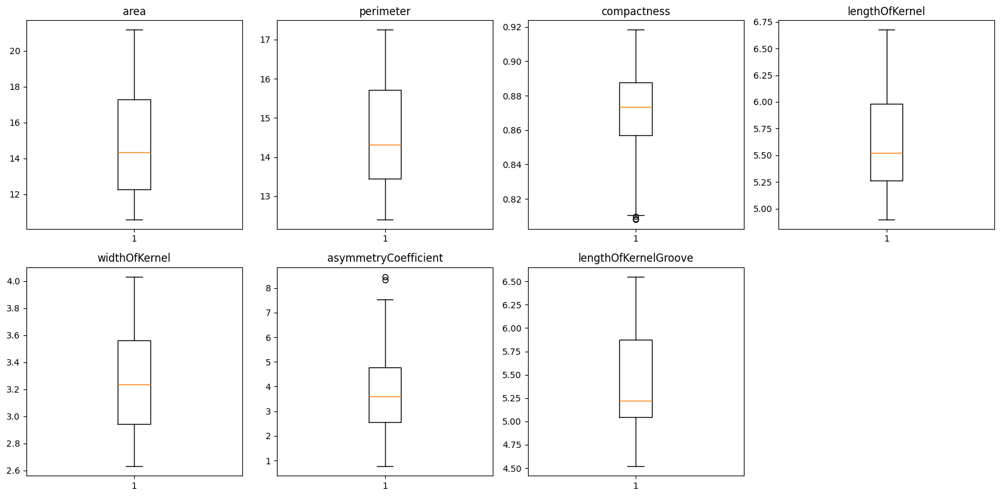

In [10]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Transforma os eixos em vetor
axes = axes.flatten()

# Cria um boxplot para cada feature
for i, coluna in enumerate(features_seed.columns):

    axes[i].boxplot(features_seed[coluna])

    axes[i].set_title(coluna)

# Remove o último subplot vazio
fig.delaxes(axes[7])

# Ajusta espaçamento
plt.tight_layout()

# Mostra
plt.show()

#### Detalhes de cada um dos atributos:

- Area: O atributo area representa a área do grão e apresentou média de aproximadamente $14.85$, com valores variando entre $10.59$ e $21.18$. O desvio padrão de $2.91$ indica uma dispersão relativamente moderada dos valores em torno da média, mostrando que existem grãos significativamente maiores e menores dentro do dataset. A diferença entre o primeiro e o terceiro quartil também demonstra boa variabilidade, o que pode contribuir positivamente para a distinção entre classes.

- Perímetro: O atributo perimeter, responsável por medir o perímetro dos grãos, apresentou média de $14.56$ e desvio padrão de aproximadamente $1.31$. Comparado à área, esse atributo possui menor dispersão relativa, indicando que os perímetros dos grãos tendem a variar menos do que suas áreas. Ainda assim, a diferença entre os valores mínimo e máximo mostra que existe diversidade suficiente para auxiliar na classificação.

- Compacidade:  A compactness representa a compacidade do grão, calculada a partir da relação entre área e perímetro. Esse atributo apresentou média de $0.871$ e um desvio padrão muito baixo, aproximadamente $0.024$. Isso mostra que os valores estão bastante concentrados próximos da média, indicando pouca variação entre os grãos em relação à sua forma geométrica geral. Mesmo apresentando baixa dispersão, atributos assim podem ser relevantes para algoritmos de classificação, principalmente quando pequenas diferenças possuem significado importante.

- Largura do Grão: O atributo lengthOfKernel, correspondente ao comprimento do grão, apresentou média de aproximadamente $5.63$ e desvio padrão de $0.44$. Os valores encontram-se relativamente concentrados, mas ainda apresentam uma faixa de variação suficiente para diferenciar amostras. Como comprimento é uma característica física importante do grão, esse atributo provavelmente possui relevância para a separação das classes do dataset.

- Comprimento do Grão: A widthOfKernel, que representa a largura do grão, apresentou média de $3.26$ e desvio padrão de aproximadamente $0.38$. Assim como o comprimento, os dados apresentam dispersão moderada, indicando diferenças perceptíveis entre os grãos analisados. Além disso, os quartis mostram distribuição relativamente equilibrada, sugerindo ausência de grandes concentrações extremas.

- Coeficiente de Assimetria: O atributo asymmetryCoefficient foi o que apresentou maior variabilidade entre todos os atributos. Sua média foi aproximadamente $3.70$, porém com desvio padrão de $1.50$ e valores variando entre $0.77$ e $8.46$. Essa grande dispersão indica que existem grãos com níveis de assimetria bastante distintos. Características com alta variabilidade costumam fornecer informação relevante para algoritmos de classificação, embora também possam indicar presença de outliers ou distribuições menos uniformes.

- Comprimento da Ranhura do Grão: Por fim, o atributo lengthOfKernelGroove, relacionado ao comprimento do sulco do grão, apresentou média de aproximadamente $5.41$ e desvio padrão de $0.49$. Os valores mostram dispersão moderada e distribuição relativamente estável ao longo do dataset. Como o sulco é uma característica estrutural importante dos grãos de trigo, esse atributo pode contribuir significativamente para a distinção entre diferentes variedades.


### Aplicação de KNN e Naive Bayes no Dataset de Sementes:

---



### Validação Cruzada K-Fold
O K-Fold Cross-Validation é uma técnica robusta usada para avaliar o desempenho dos modelos de machine learning. Isso ajuda a garantir que o modelo seja bem generalizado para dados não vistos, usando diferentes partes do conjunto de dados para treinamento e teste em várias iterações.

#### Diferença de Validação Cruzada K-Fold e Divisão Treinamento e Teste

Enquanto o K-Fold Cross-Validation divide o conjunto de dados em vários subconjuntos para treinar e testar iterativamente o modelo, o método Train-Test Split divide o conjunto de dados em apenas duas partes: uma para treinamento e outra para teste. O método Train-Test Split é simples e rápido de implementar, mas a estimativa de desempenho pode ser altamente dependente da divisão específica, o que leva a uma alta variação nos resultados.

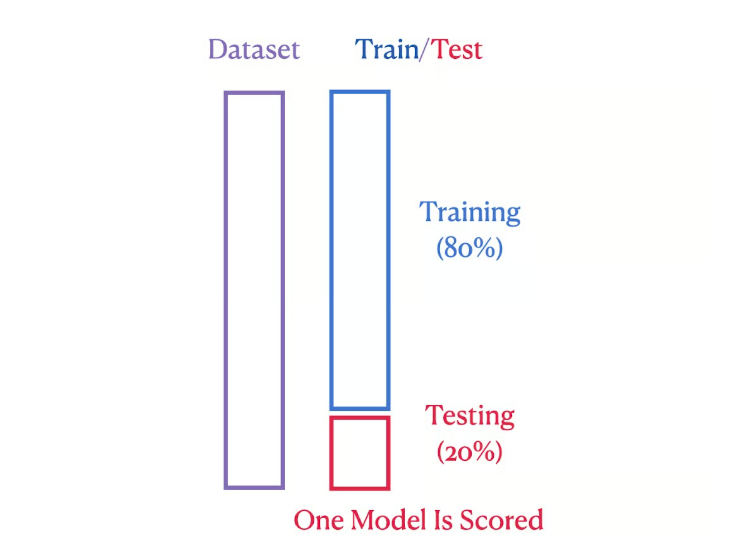

Essa primeira imagem mostra o método Train-Test Split, em que o conjunto de dados é dividido em 80% de segmentos de treinamento e 20% de teste.

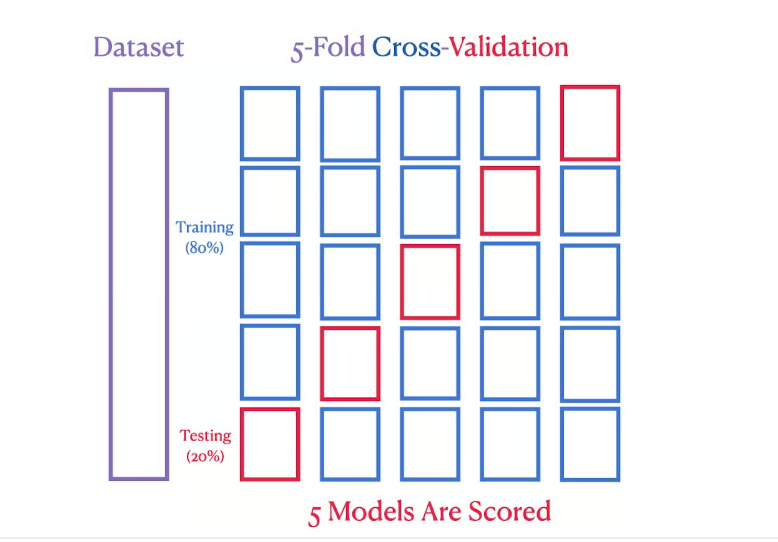

Essa segunda imagem mostra uma validação cruzada 5 vezes, em que o conjunto de dados é dividido em cinco partes, com cada parte servindo como um conjunto de teste em uma das cinco iterações, garantindo que cada segmento seja usado tanto para treinamento quanto para teste.

#### O que K representa em Validação Cruzada K-Fold

Na validação cruzada K-Fold, "K" representa o número de grupos em que o conjunto de dados é dividido. Esse número determina quantas rodadas de testes o modelo passa, garantindo que cada segmento seja usado como um conjunto de testes uma vez.

O número de dobras, ou "K", na validação cruzada K-Fold afeta tanto a granularidade do processo de validação quanto a carga computacional. Um K menor (por exemplo, 3 a 5) pode ser mais rápido, mas pode gerar estimativas menos confiáveis, pois cada dobra representa uma parte maior do conjunto de dados, o que pode deixar de fora diversos cenários de dados.

Um K maior (por exemplo, 10) oferece uma avaliação mais detalhada ao custo de mais cálculos. Um ponto de partida comum é K=5 ou K=10, que geralmente são suficientes para obter uma estimativa confiável sem cálculos excessivos.

In [11]:
# Definição da técnica de Reamostragem
# Optei pelo StratifiedKfold pois o KFold não tentava manter a mesma
# frequência de classes entre os folds. Ele também é mais recomendado
K_Fold = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

#### A Normalização

Ocorre pois o dimensionamento de recursos é uma etapa importante na preparação de dados para modelos de aprendizado de máquina. Isso envolve a transformação dos valores dos recursos em um conjunto de dados em uma escala semelhante, garantindo que todos os recursos contribuam igualmente para o processo de aprendizado do modelo.

O escalonamento de recursos é importante porque, quando os recursos estão em escalas muito diferentes, como um recurso que varia de 1 a 10 e outro de 1.000 a 10.000, os modelos podem priorizar os valores maiores, o que leva a um viés nas previsões. Isso pode resultar em um desempenho ruim do modelo e em uma convergência mais lenta durante o treinamento.

Em razão disso usa-se a Normalização. De modo geral, a normalização refere-se ao processo de ajuste de valores medidos em escalas diferentes para uma escala comum. Às vezes, é melhor ilustrar com um exemplo. Para cada tipo de normalização abaixo, consideraremos um modelo para entender a relação entre o preço de uma casa e seu tamanho.

Além do mais, a normalização é necessária ao usar algoritmos de aprendizado de máquina que dependem de distâncias entre pontos de dados, como o **K-Nearest Neighbors** (KNN), para evitar que recursos com escalas maiores dominem os cálculos de distância.


Após isso se aplica os algoritmos de Machine Learning: KNN e Naive Bayes.

### Algoritmo KNN

---

O algoritmo k-nearest neighbors (KNN), ou k vizinhos mais próximos, é um classificador de aprendizado supervisionado não paramétrico, que usa a proximidade para fazer classificações ou previsões sobre o agrupamento de um determinado ponto de dados.

Embora o algoritmo KNN possa ser usado para problemas de regressão ou classificação, ele é tipicamente utilizado como um algoritmo de classificação, partindo do pressuposto de que pontos semelhantes podem ser encontrados próximos uns dos outros.

Para os problemas de classificação, um rótulo de classe é atribuído com base em uma votação majoritária. Ou seja, o rótulo mais frequentemente representado em torno de um dado ponto de dados é utilizado. Embora isso seja tecnicamente considerado uma "votação por pluralidade", o termo "voto majoritário" é mais amplamente usado na literatura.

A distinção entre esses termos é que "votação majoritária" tecnicamente requer uma maioria de mais de 50%, o que funciona principalmente quando há apenas duas categorias. Quando se tem várias classes, por exemplo, quatro categorias, você não precisa necessariamente de 50% dos votos para fazer uma conclusão sobre uma classe; você poderia atribuir um rótulo de classe com mais de 25% de votos.

Também vale observar que o algoritmo KNN faz parte de uma família de modelos de "aprendizado preguiçoso", o que significa que ele apenas armazena um conjunto de dados de treinamento, em vez de passar por uma fase de treinamento. Isso também significa que toda a computação ocorre quando uma classificação ou previsão está sendo feita.

Como ele depende bastante da memória para armazenar todos os seus dados de treinamento, também é chamado de método de aprendizado baseado em instância ou em memória.

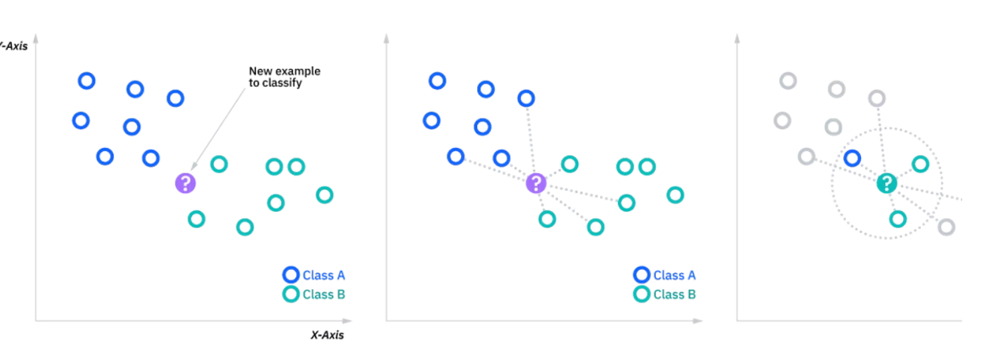

o objetivo do algoritmo k-nearest neighbors (KNN) é identificar os vizinhos mais próximos de um determinado ponto de consulta, para que se possa atribuir uma classe a esse ponto. Para fazer isso, o KNN tem alguns requisitos.

**Determine suas métricas de distância:**

Para determinar quais pontos de dados estão mais próximos de um determinado ponto de consulta, é necessário calcular a distância entre o ponto de consulta e os outros pontos de dados. Essas métricas de distância ajudam a formar limites de decisão, que particionam os pontos de consulta em diferentes regiões.

**Definir o K:**

O valor de k no algoritmo KNN define quantos vizinhos serão verificados para determinar a classificação de um ponto de consulta específico. Por exemplo, se k=1, a instância será atribuída à mesma classe que seu vizinho mais próximo.

Definir k pode ser um ato de equilíbrio, pois diferentes valores podem levar a overfitting ou underfitting. Valores mais baixos de k podem ter alta variância, mas baixa tendência, e valores maiores de k podem levar a alta tendência e menor variância.

A escolha de k dependerá amplamente dos dados de input, já que dados com mais outliers ou ruído provavelmente terão melhor desempenho com valores mais altos de k. No geral, recomenda-se um **número ímpar** para k, a fim de evitar empates na classificação, e táticas de validação cruzada podem ajudar a escolher o k ideal para seu conjunto de dados.

In [12]:
# Definição da função de KNN
KNN = KNeighborsClassifier()

### Algoritmo Naive Bayes
---

O algoritmo Naive Bayes é um classificador probabilístico que assume que as características (features) são independentes entre si, daí o termo “naive” (ingênuo). Essa é uma simplificação feita para facilitar o cálculo das probabilidades condicionais necessárias para classificação.

Na prática, o algoritmo Naive Bayes é frequentemente utilizado para classificar textos, como na detecção de spam ou na categorização de documentos. Ele usa a frequência das palavras para calcular a probabilidade de um documento pertencer a uma determinada classe (Como na atividade G sobre spam ou não spam de mensagens).

Ele assume que os preditores em um modelo de Naive Bayes são condicionalmente independentes, ou seja, não estão relacionados a nenhuma das outras características no modelo. Também pressupõe que todos os recursos contribuem igualmente para o resultado

Embora essas suposições sejam frequentemente violadas em cenários do mundo real (por exemplo, uma palavra subsequente em um e-mail depende da palavra que a precede), isso simplifica um problema de classificação tornando-o mais computacionalmente viável. Isso significa que agora apenas uma única probabilidade será necessária para cada variável, o que, por sua vez, torna o cálculo do modelo mais fácil. Apesar dessa suposição de independência irrealista, o algoritmo de classificação tem um bom desempenho, especialmente com tamanhos de amostra pequenos.

O algoritmo de Naive Bayes consiste em encontrar a probabilidade a posteriori (ter a condição, dado um resultado positivo), multiplicando a probabilidade a priori (ter a condição) pela probabilidade de “receber um resultado positivo, dado que possui a condição”.

Também devemos calcular a probabilidade a posteriori da negação (não ter a condição, dado um resultado positivo).


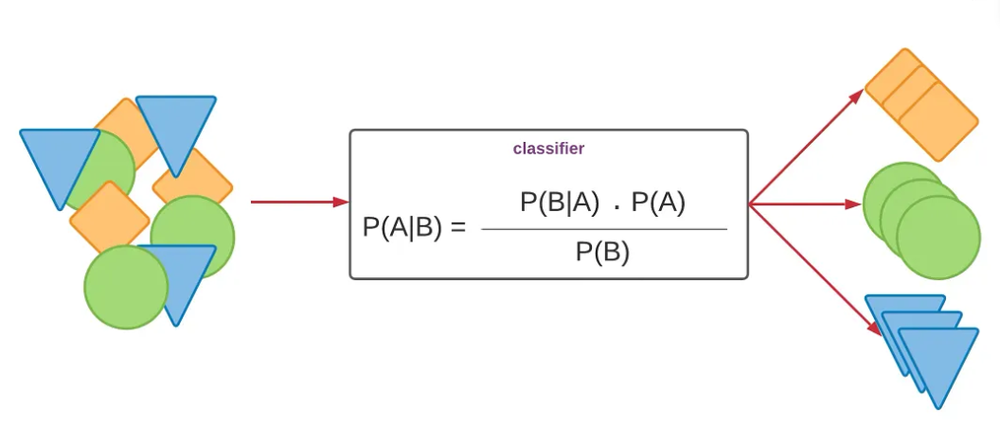

In [13]:
# Definição da função de Naive Bayes
NB = GaussianNB()

### Gráfico Boxplot e Comparação de Resultados

#### 5-fold cross-validation para KNN e Naive Bayes

In [14]:
# Função para 5-Fold Cross Validation com os algoritmos
# de Machine Learning KNN e Naive Bayes
def cross_validation_5k(features, target, kfold, knn, nb):

    KNN_score = []
    NB_score = []

    for train_index, test_index in kfold.split(features, target):

        # Separação treino/teste
        features_train = features.iloc[train_index]
        features_test = features.iloc[test_index]

        target_train = target.iloc[train_index]
        target_test = target.iloc[test_index]
        # Normalização
        scaler = StandardScaler()
        scaler.fit(features_train)

        features_train_norm = scaler.transform(features_train)
        features_test_norm = scaler.transform(features_test)

        # KNN
        knn.fit(features_train_norm, target_train)

        target_pred_KNN = knn.predict(features_test_norm)

        acuracia_KNN = accuracy_score(target_test, target_pred_KNN)
        KNN_score.append(acuracia_KNN)

        # Naive Bayes
        nb.fit(features_train_norm, target_train)

        target_pred_NB = nb.predict(features_test_norm)

        acuracia_NB = accuracy_score(target_test, target_pred_NB)
        NB_score.append(acuracia_NB)

    return KNN_score, NB_score

In [15]:
dados = cross_validation_5k(features_seed, target_seed, K_Fold, KNN, NB)

In [18]:
# Visualização dos Resultados dos folds

KNN_score = dados[0]
NGB_score = dados[1]

print("Resultados KNN:")
print(KNN_score)

print()

print("Resultados Naive Bayes:")
print(NGB_score)

Resultados KNN:
[0.9761904761904762, 0.8809523809523809, 1.0, 0.8571428571428571, 0.9047619047619048]

Resultados Naive Bayes:
[0.8571428571428571, 0.8809523809523809, 0.9761904761904762, 0.8333333333333334, 0.9047619047619048]


O modelo KNN apresentou resultados de acurácia iguais a $1.0$, $0.9286$, $0.8810$, $0.9524$ e $0.9048$ nos cinco folds da validação cruzada. A média desses resultados foi aproximadamente $0.933$, indicando um desempenho relativamente elevado do modelo durante a classificação dos dados. Os valores obtidos demonstram que o KNN conseguiu manter uma acurácia relativamente alta em todos os folds, apresentando uma boa capacidade de generalização.

Em relação à moda, não foi possível identificar um valor modal representativo, já que nenhuma das accuracies se repetiu exatamente. Isso ocorre porque as métricas de desempenho são valores contínuos, tornando pouco comum a repetição exata dos resultados entre diferentes folds.

Gráfico

/tmp/ipykernel_22570/1805822593.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


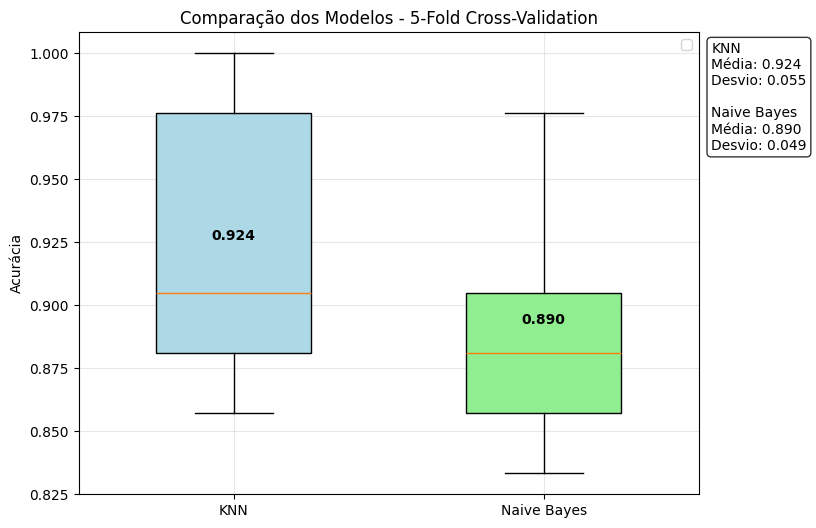

In [20]:
# Estatísticas
media_knn = np.mean(KNN_score)
media_nb = np.mean(NGB_score)

std_knn = np.std(KNN_score)
std_nb = np.std(NGB_score)

fig, ax = plt.subplots(figsize=(8, 6))

box = ax.boxplot( dados, patch_artist=True, tick_labels=["KNN", "Naive Bayes"], widths=0.5)

cores = ["lightblue", "lightgreen"]

for patch, cor in zip(box['boxes'], cores):
    patch.set_facecolor(cor)

medias = [media_knn, media_nb]

for i, media in enumerate(medias, start=1):

    ax.text( i, media + 0.002, f'{media:.3f}', ha='center', fontsize=10, fontweight='bold')


texto = ( f"KNN\n" f"Média: {media_knn:.3f}\n" f"Desvio: {std_knn:.3f}\n\n" f"Naive Bayes\n" f"Média: {media_nb:.3f}\n" f"Desvio: {std_nb:.3f}")

ax.text(1.02, 0.98, texto, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict( boxstyle='round', facecolor='white', alpha=0.8))

ax.set_ylabel("Acurácia")
ax.set_title("Comparação dos Modelos - 5-Fold Cross-Validation")

ax.grid(alpha=0.3)

ax.legend()

plt.show()

O modelo KNN apresentou resultados de accuracy iguais a $1.0$, $0.9286$, $0.8810$, $0.9524$ e $0.9048$ nos cinco folds da validação cruzada. A média dos resultados foi aproximadamente $0.933$, indicando um desempenho elevado e consistente ao longo das diferentes divisões dos dados. O desvio padrão obtido foi de $0.041$, mostrando que houve relativamente pouca variação entre os folds, o que sugere boa estabilidade do modelo durante o processo de classificação.

Já o modelo Gaussian Naive Bayes apresentou accuracies de $0.8571$, $0.8810$, $0.9762$, $0.8333$ e $0.9048$. A média obtida foi aproximadamente $0.890$, valor inferior ao desempenho médio do KNN. O desvio padrão encontrado foi de $0.049$, ligeiramente maior que o do KNN, indicando uma variação um pouco mais elevada entre os folds e, consequentemente, menor estabilidade nos resultados.

#### 5-Fold Cross Validation com 10 repetições para cada método

In [21]:
resultados_knn = []
resultados_nb = []

for i in range(10):

    K_Fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=i)

    scores_knn, scores_nb = cross_validation_5k(features_seed, target_seed, K_Fold, KNN, NB)

    resultados_knn.append(scores_knn)
    resultados_nb.append(scores_nb)

In [22]:
# Visualização dos Resultados dos folds

print("Resultados KNN:")
print(resultados_knn)

print()

print("Resultados Naive Bayes:")
print(resultados_nb)

Resultados KNN:
[[0.9523809523809523, 0.9285714285714286, 0.9285714285714286, 0.8571428571428571, 0.9761904761904762], [0.9285714285714286, 0.9523809523809523, 0.9523809523809523, 0.8809523809523809, 0.8809523809523809], [0.9523809523809523, 0.8809523809523809, 0.9285714285714286, 0.9523809523809523, 0.9047619047619048], [0.9285714285714286, 0.9523809523809523, 0.8809523809523809, 0.9523809523809523, 0.9523809523809523], [0.9523809523809523, 0.9047619047619048, 0.9047619047619048, 0.9523809523809523, 0.9047619047619048], [0.9047619047619048, 0.9523809523809523, 0.8809523809523809, 0.9761904761904762, 0.8809523809523809], [0.9761904761904762, 0.9523809523809523, 0.9047619047619048, 0.9047619047619048, 0.9047619047619048], [1.0, 0.9523809523809523, 0.9761904761904762, 0.8333333333333334, 0.9047619047619048], [0.9523809523809523, 0.9047619047619048, 0.9047619047619048, 0.9523809523809523, 0.9285714285714286], [1.0, 0.9285714285714286, 0.8809523809523809, 0.9523809523809523, 0.904761904761

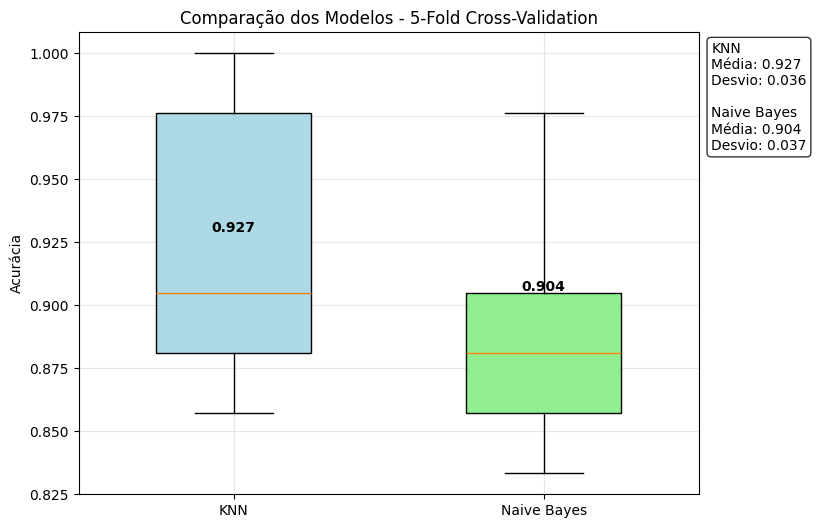

In [25]:
# Estatísticas

media_knn_10 = np.mean(resultados_knn)
media_nb_10 = np.mean(resultados_nb)

std_knn = np.std(resultados_knn)
std_nb = np.std(resultados_nb)

fig, ax = plt.subplots(figsize=(8, 6))

box = ax.boxplot( dados, patch_artist=True, tick_labels=["KNN", "Naive Bayes"], widths=0.5)

cores = ["lightblue", "lightgreen"]

for patch, cor in zip(box['boxes'], cores):
    patch.set_facecolor(cor)

medias = [media_knn_10, media_nb_10]

for i, media in enumerate(medias, start=1):

    ax.text( i, media + 0.002, f'{media:.3f}', ha='center', fontsize=10, fontweight='bold')


texto = ( f"KNN\n" f"Média: {media_knn_10:.3f}\n" f"Desvio: {std_knn:.3f}\n\n" f"Naive Bayes\n" f"Média: {media_nb_10:.3f}\n" f"Desvio: {std_nb:.3f}")

ax.text(1.02, 0.98, texto, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict( boxstyle='round', facecolor='white', alpha=0.8))

ax.set_ylabel("Acurácia")
ax.set_title("Comparação dos Modelos - 5-Fold Cross-Validation")

ax.grid(alpha=0.3)

plt.show()

Após as 10 execuções do processo de 5-fold cross-validation (Validação Cruzada de K-Fold), observou-se que o modelo KNN apresentou uma média de accuracy igual a $0.927$, enquanto o Gaussian Naive Bayes obteve média de $0.904$. Esses resultados apontam para o fato de que, de maneira geral, o KNN apresentou melhor desempenho na tarefa de classificação do dataset, alcançando valores médios de accuracy superiores ao Naive Bayes ao longo das diferentes execuções.

Além da média, o desvio padrão também permite avaliar a estabilidade dos modelos. O KNN apresentou desvio padrão de $0.036$, enquanto o Naive Bayes apresentou desvio de $0.037$. Como os valores são bastante próximos, isso indica que ambos os métodos apresentaram comportamento relativamente estável entre as diferentes execuções da validação cruzada.

Em relação à moda, percebe-se que alguns valores de accuracy aparecem repetidamente ao longo das execuções, principalmente valores próximos de 0.90, 0.92 e 0.95. Isso sugere que ambos os modelos tendem a convergir para determinadas faixas de desempenho com frequência. Mas, vale ressaltar que não é comum haver repetição de valores nesse tipo de modelagem, os valores flutuam sobre uma determinada faixa de valor, mas não são exatamento iguais devido as suas casas decimais.

# B ) Conceitos básicos de aprendizado de máquina


---




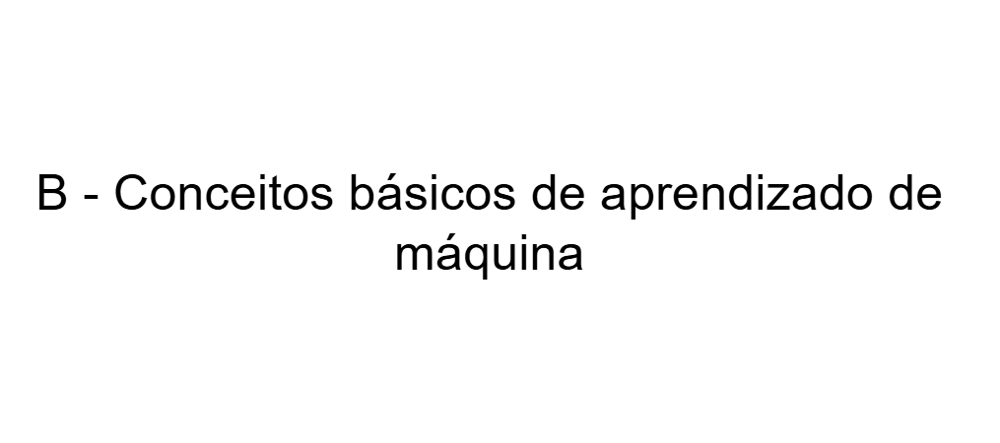

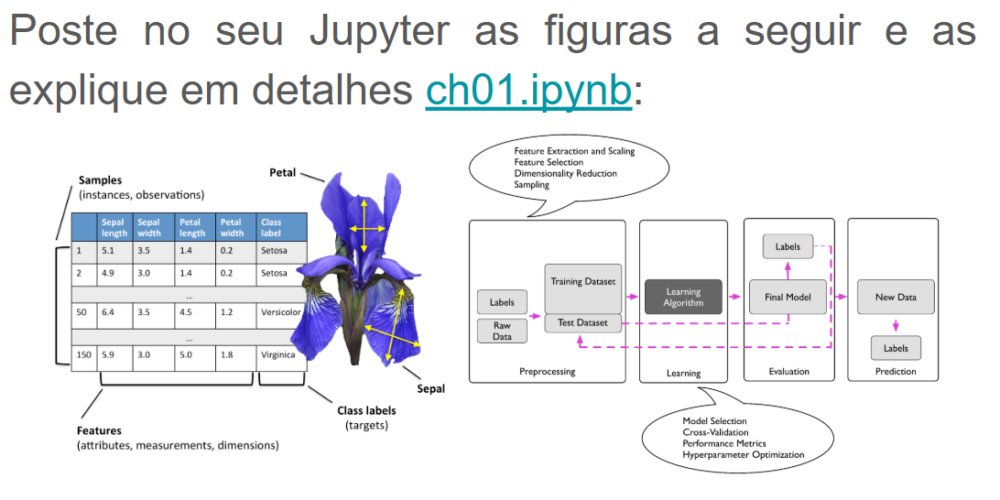

### Explicação das imagens a baixo:

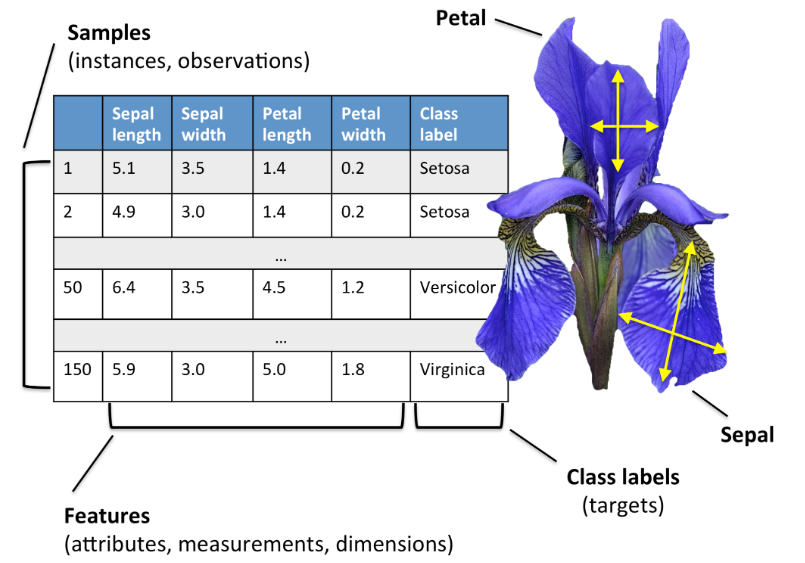

Essa primeira imagem está indicando as features da flor mostrada, features (características). Isto é, samples (amostras) que indicam as características observadas em cada flor que fez parte do processo de coleta de seus dados, as classes são o modo como elas são divididas, como são de espécies de plantas diferentes a classe é a parte principal para distinção e obtenção de características marcantes de um determinado tipo de flor. No exemplo da imagem, há uma flor que está tendo as medidas (comprimento e largura) de sua pétala e de sua sépala medidas.

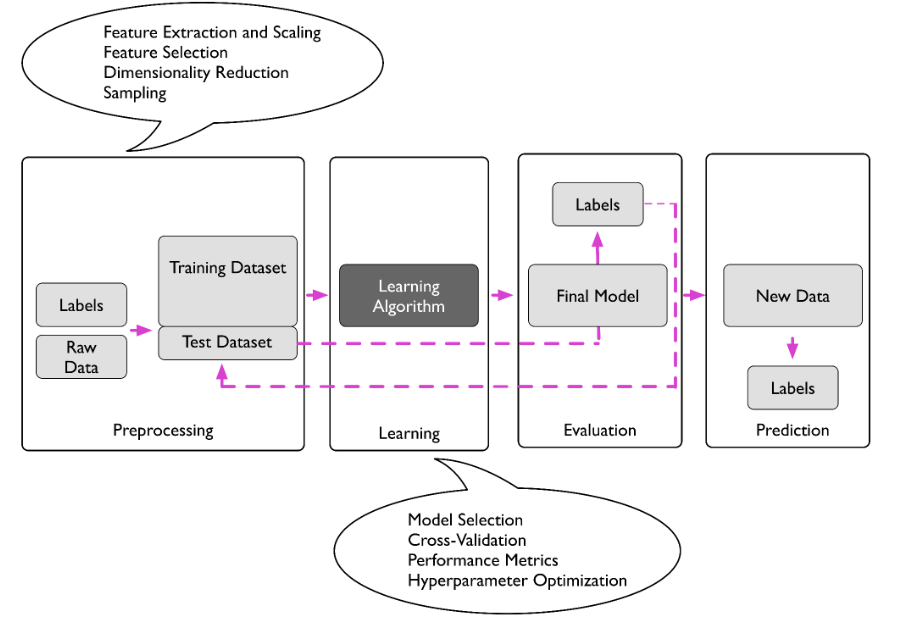

A segunda imagem, esse diagrama ilustra um fluxo de procedimentos normalmente feitos para aprendizado de máquina de modelos preditivos. O primeiro quadrado fala sobre o preprocessamento dos dados, no caso formar a base de dados, como a exemplo de pegar imagens de felinos e retirar características e fazer a transformação delas numa escala (basicamente converter para o mesmo tipo), após isso tem de se fazer a retirada de dados que não serão úteis ou que são redundantes. Já o processo de aprendizado consiste em selecionar um método de aprendizado de máquina preditivo e testar com a base dados para teste, posteriormente é usada outra base de dados, para analisar a performance geral do modelo, além do mais, é necessário fazer o ajuste dos hiperparâmetros. Por fim, caso o modelo esteja dando resultados bons, então o modelo passa a ser usado na etapa de predição em situações reais.

# C ) Métricas

---




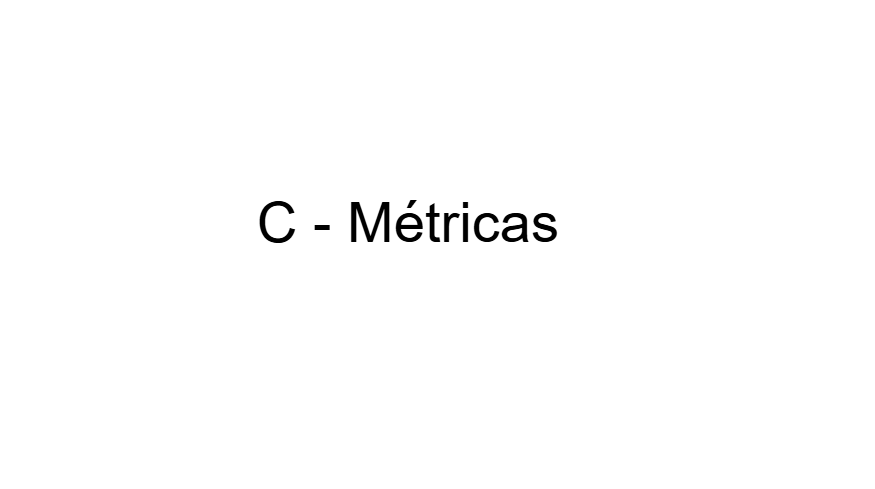

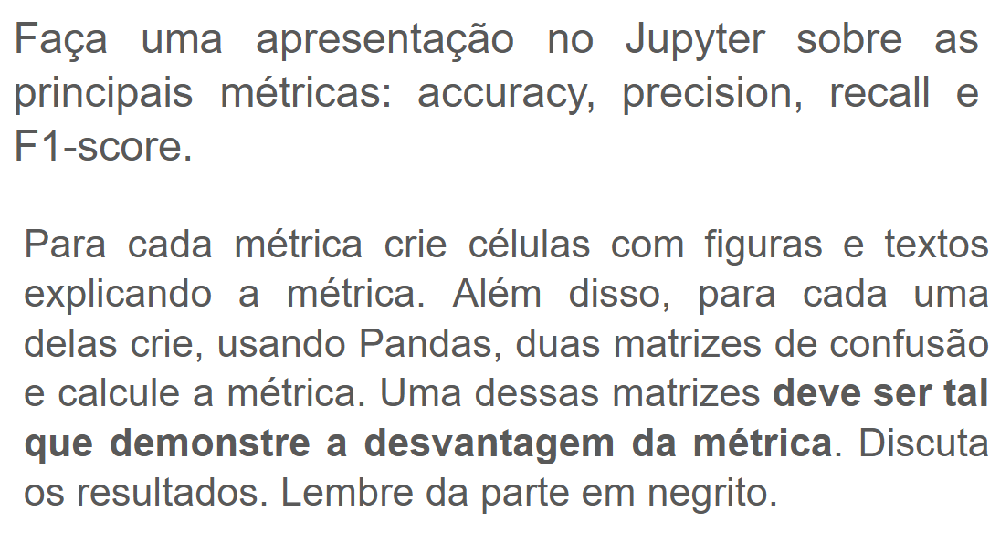

## Matriz de Confusão


---


Uma matriz de confusão (ou matriz de erro) é uma forma de visualização para resultados de algoritmo classificador. Mais especificamente, é uma tabela que decompõe o número de instâncias da verdade fundamental de uma classe específica em relação ao número de instâncias de classes previstas. As matrizes de confusão são uma das várias métricas de avaliação que medem o desempenho de um modelo de classificação. Podem ser utilizadas para calcular uma série de outras métricas de desempenho do modelo.

A matriz de confusão ajuda a avaliar o desempenho do modelo de classificação no aprendizado de máquina comparando os valores previstos com os valores reais de um conjunto de dados.

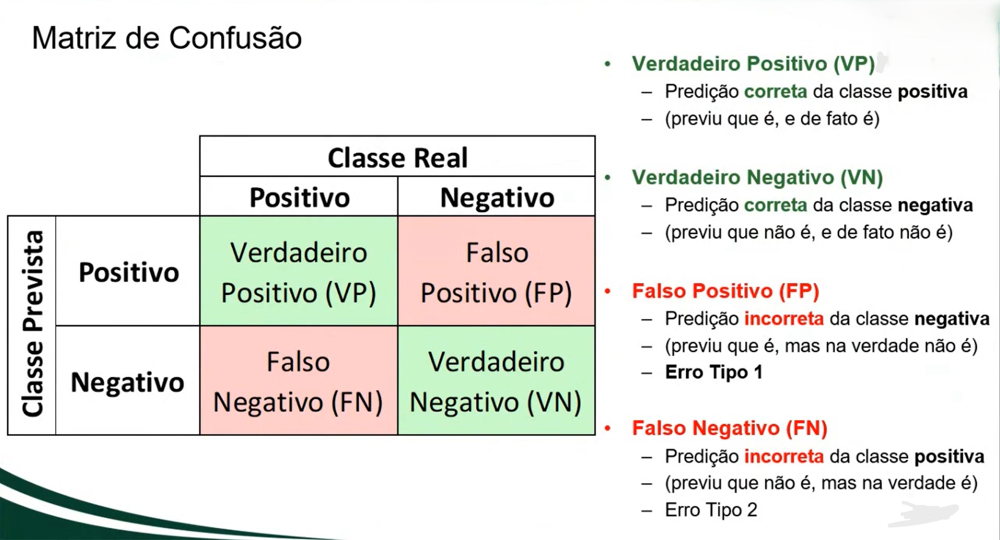

A matriz abaixo usa outra forma de organização onde as colunas são os dados previstos, ao passo que as linhas são os dados reais.

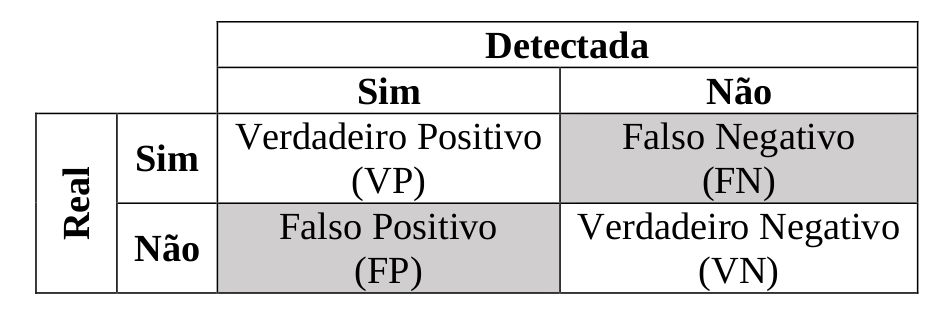

A caixa superior esquerda informa o número de positivos verdadeiros (TP), sendo o número de previsões corretas da classe positiva. A caixa abaixo apresenta falsos positivos (FP), essas instâncias de classe negativa identificadas incorretamente como casos positivos. São também chamados de erros do tipo I em estatísticas. A caixa superior direita apresenta o número de falsos negativos (FN), as instâncias positivas reais previstas incorretamente como negativas. Finalmente, a caixa inferior direita exibe o número de verdadeiros negativos (VN), ou as instâncias de classe negativa reais previstas com precisão. O total de cada um desses valores apresentaria o número total de previsões do modelo.

## Método de Accuracy (Acurácia)


---

A acurácia é a proporção de todas as classificações que estavam corretas, sejam elas positivas ou negativas. Ela é definida matematicamente como:

$$Acurácia= \frac{VP + VN}{VP + VN + FP + FN} $$

Onde:
- VP (Verdadeiro Positivo)
- VN (Verdadeiro Negativo)
- FP (Falso Positivo)
- FN (Falso Negativo)

A fórmula é basicamente:

$$Acurácia= \frac{PrevisõesCorretas}{TotalPrevisões} $$

Como incorpora todos os quatro resultados da matriz de confusão (VP, FP, VN, FN), dado um conjunto de dados equilibrado, com números semelhantes de exemplos em ambas as classes, a acurácia pode servir como uma medida aproximada da qualidade do modelo.

Por isso, ela costuma ser a métrica de avaliação padrão usada para modelos genéricos ou não especificados que realizam tarefas genéricas ou não especificadas.

No entanto, quando o conjunto de dados está desequilibrado ou quando um tipo de erro (FN ou FP) é mais caro que o outro, o que acontece na maioria das aplicações do mundo real, é melhor otimizar uma das outras métricas.


Exemplo: Modelo que prevê se um paciente é HIV positivo

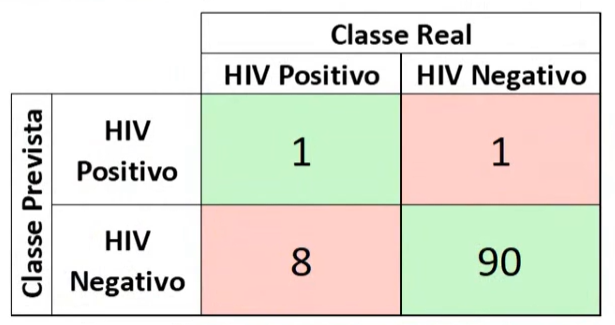

In [50]:
def acuracia(matriz):
    VP = matriz.iloc[0, 0]
    VN = matriz.iloc[1, 1]
    FP = matriz.iloc[1, 0]
    FN = matriz.iloc[0, 1]

    return ((VP + VN) / (VP+VN+FP+FN))

In [ ]:
# [ [1, 1], [8, 90] ] organizada em linhas essa é a Matriz de Confusão
HIV_previsao_1 = pd.DataFrame([[1, 1], [8, 90]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

HIV_previsao_1

In [ ]:
resultado = acuracia(HIV_previsao_1)

print(f"Acurácia do Modelo 1: {resultado:.3%}")

In [ ]:
HIV_previsao_2 = pd.DataFrame([[18, 2], [3, 77]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

HIV_previsao_2

In [ ]:
resultado = acuracia(HIV_previsao_2)

print(f"Acurácia do Modelo 2: {resultado:.3%}")

A acurácia pode acabar se tornando equívoca em bases desbalanceadas, visto que muitos acertos na classe majoritária aumentam o valor da métrica mesmo quando o modelo erra casos importantes, como pacientes com HIV. É notável que o primeiro exemplo (que tem a imagem) é muito desbalanceado, além do fato de levar a uma interpretação muito distorcida dos resultados, uma vez que o número de pessoas HIV positivo na tabela 1 era de 9 pessoas (cerca de $11.1\%$ do total)ao passo que o modelo só atestou 1 delas como soropositivo. Quanto a segunda Matriz de Confusão, o modelo tinha 21 soropositivos e o modelo previu que 18 deles como positivos (cerca de $85.7\%$ do total). Percebe-se que ambos tem acurácias altas, mesmo que as suas exatidões em acerto mudam drasticamente, além de ser perceptível que mesmo os modelos tendo acurácia alta, ainda sim não seriam seguros para serem usados em ambientes reais, principalmente o primeiro modelo.

## Método de Precision


---

A precisão é a proporção de todas as classificações positivas do modelo que são realmente positivas. Ela é definida matematicamente como:

$$Precisão= \frac{VP}{VP + FP} $$

Um modelo perfeito hipotético não teria falso positivo, isto é, uma precisão de 1,0 ($100\%$).

Em um conjunto de dados desequilibrado em que o número de positivos reais é muito baixo a precisão é menos significativa e menos útil como uma métrica.



Exemplo: Prever se um animal é um Gato

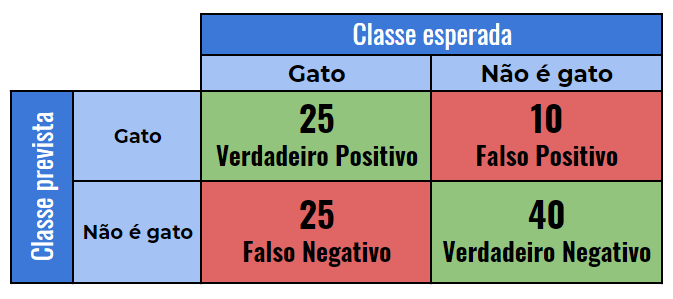

In [ ]:
def precisao(matriz):
    VP = matriz.iloc[0, 0]
    FP = matriz.iloc[1, 0]

    return ((VP) / (VP+FP))

In [ ]:
# [ [25, 10], [25, 40] ] organizada em linhas essa é a Matriz de Confusão
Gato_previsao_1 = pd.DataFrame([[25, 10], [25, 40]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

Gato_previsao_1

In [ ]:
resultado = precisao(Gato_previsao_1)

print(f"Precisão do Modelo 1: {resultado:.3%}")

In [ ]:
Gato_previsao_2 = pd.DataFrame([[5, 45], [1, 49]], columns=["Previsto Positivo", "Previsto Negativo"], index=["Real Positivo", "Real Negativo"])

Gato_previsao_2

In [ ]:
resultado = precisao(Gato_previsao_2)

print(f"Precisão do Modelo 2: {resultado:.3%}")

A precisão pode apresentar valores altos mesmo quando o modelo deixa de identificar muitos casos positivos, pois a métrica não considera os falsos negativos. Dessa forma pode-se perceber que a precisão acaba tornando-se menos útil em casos como esse, onde os resultados acabam causando engano, a exemplo da tabela 2, onde o modelo previu que 45 animais não eram gatos, embora fossem, ao passo que identificou apenas 5 animais como gatos, dado que  a precisão da tabela 2 foi de $83.3\%$ é notável como a precisão pode facilmente ser distorcida, caso não sejam observadas outras métricas junto dela para confirmar a funcionalidade do modelo. Isso não é tão observável na tabela 1, visto que sua precisão é de $50\%$, ela condiz com o que ocorre no modelo.

## Recall

---
A taxa de verdadeiro positivo (TVP), ou a proporção de todos os positivos reais que foram classificados corretamente como positivos, também é conhecida como recall.

O recall é definido matematicamente como:

$$Precisão= \frac{VP}{VP + FN} $$

Os falsos negativos são positivos reais que foram classificados incorretamente como negativos. Por isso, eles aparecem no denominador.

Um modelo perfeito hipotético teria zero falsos negativos e, portanto, um recall (TPR) de 1,0, ou seja, uma taxa de detecção de 100%.

Em um conjunto de dados desbalanceado em que o número de positivos reais é muito baixo, o recall é uma métrica mais significativa do que a acurácia, porque mede a capacidade do modelo de identificar corretamente todas as instâncias positivas. Um falso negativo geralmente tem consequências mais graves do que um falso positivo.


Exemplo: Modelo que prevê se um animal é um cachorro

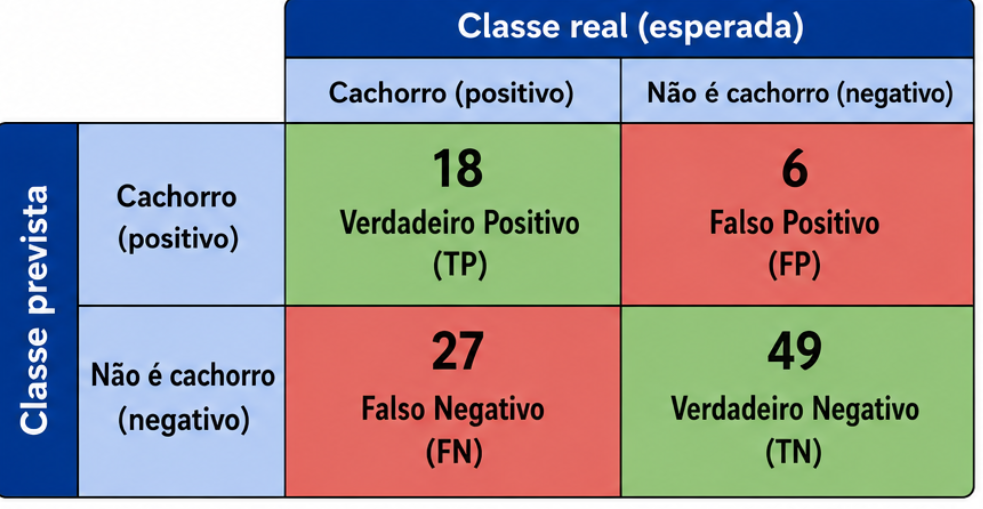

In [62]:
def recall(matriz):
    VP = matriz.iloc[0, 0]
    FN = matriz.iloc[1, 0]

    return ((VP) / (VP+FN))

In [63]:
Cachorro_previsao_1 = pd.DataFrame([[18, 6], [27, 49]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

Cachorro_previsao_1

,Real Positivo,Real Negativo
Previsto Positivo,18,6
Previsto Negativo,27,49


In [64]:
resultado = recall(Cachorro_previsao_1)

print(f"Recall do Modelo 1: {resultado:.3%}")

Recall do Modelo 1: 40.000%


In [65]:
Cachorro_previsao_2 = pd.DataFrame([[45, 40], [5, 10]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

Cachorro_previsao_2

,Real Positivo,Real Negativo
Previsto Positivo,45,40
Previsto Negativo,5,10


In [66]:
resultado = recall(Cachorro_previsao_2)

print(f"Recall do Modelo 2: {resultado:.3%}")

Recall do Modelo 2: 90.000%


O recall pode apresentar valores altos mesmo quando o modelo gera muitos falsos positivos, pois a métrica considera apenas a capacidade de identificar casos positivos reais. Dessa forma, o modelo pode aparentar bom desempenho enquanto classifica incorretamente muitos casos negativos como positivos. Isso é justamente o que ocorre com mais intensidade na tabela 2, onde mesmo apresentando um recall de $90\%$, o modelo deduziu de erroneamente que 40 animais eram cachorros, por conta disso a métrica faz parecer que o desempenho do modelo é bom, mas quando o analisado de forma geral fica perceptível que ele tem falhas.

## F1-Score

---

O F1-Score é uma métrica de desempenho crítica na aprendizagem automática que combina precisão e recuperação numa única média harmónica. É particularmente útil para avaliar modelos de classificação em que o conjunto de dados está desequilibrado ou em que os falsos positivos e os falsos negativos acarretam custos diferentes.

Ao contrário da precisão direta, que pode ser enganosa se uma classe dominar o conjunto de dados, o F1-Score fornece uma visão mais equilibrada da capacidade de um modelo identificar instâncias relevantes corretamente, minimizando erros.

Ao penalizar valores extremos, ele garante que uma pontuação alta só seja alcançada quando a precisão e a recuperação forem razoavelmente altas, tornando-o uma métrica básica em áreas que vão desde diagnósticos médicos até recuperação de informações.

A pontuação F1 mede o equilíbrio entre precisão e recuperação para um modelo. Ele varia de 0 a 1, onde 1 mostra precisão e recuperação perfeitas, e 0 significa um desempenho ruim.

o F1-Score é definido matematicamente como:


$$F1= 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall} $$

A precisão e o recall já tiveram suas fórmulas definidas anteriormente.

Substituindo e abrindo as fórmulas fica:

$$
F1 = 2 \cdot
\frac{
\left(\frac{VP}{VP+FP}\right)
\cdot
\left(\frac{VP}{VP+FN}\right)
}{
\left(\frac{VP}{VP+FP}\right)
+
\left(\frac{VP}{VP+FN}\right)
}
$$

Que no final resulta em:
$$F1 = \frac{2VP}{2VP + FP + FN}$$


Exemplo: Modelo para previsão de pacientes com malária

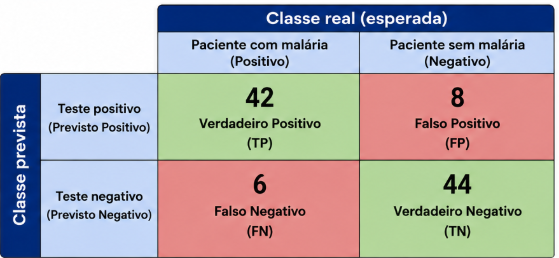

In [26]:
def F1(matriz):
    VP = matriz.iloc[0, 0]
    FP = matriz.iloc[0, 1]
    FN = matriz.iloc[1, 0]

    return ((2 * VP) / (2*VP+FP+FN))

In [27]:
Malaria_previsao_1 = pd.DataFrame([[42, 8], [6, 44]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

Malaria_previsao_1

,Real Positivo,Real Negativo
Previsto Positivo,42,8
Previsto Negativo,6,44


In [28]:
resultado = F1(Malaria_previsao_1)

print(f"F1-Score do Modelo 1: {resultado:.3%}")

F1-Score do Modelo 1: 85.714%


In [29]:
Malaria_previsao_2 = pd.DataFrame([[45, 40], [5, 10]], columns=["Real Positivo", "Real Negativo"], index=["Previsto Positivo", "Previsto Negativo"])

Malaria_previsao_2

,Real Positivo,Real Negativo
Previsto Positivo,45,40
Previsto Negativo,5,10


In [30]:
resultado = F1(Malaria_previsao_2)

print(f"F1-Score do Modelo 2: {resultado:.3%}")

F1-Score do Modelo 2: 66.667%


O F1-score busca equilibrar precision e recall em uma única métrica. Entretanto, essa simplificação pode ocultar problemas específicos do modelo. Na tabela 2, apesar do recall elevado, a quantidade de falsos positivos é muito alta, reduzindo significativamente a precisão. Assim, o F1-score não evidencia imediatamente qual das métricas está causando a perda de desempenho.

# D ) Comparando Naive Bayes e KNN com Estratégias Diferentes de Normalização usando o Dataset Iris


---



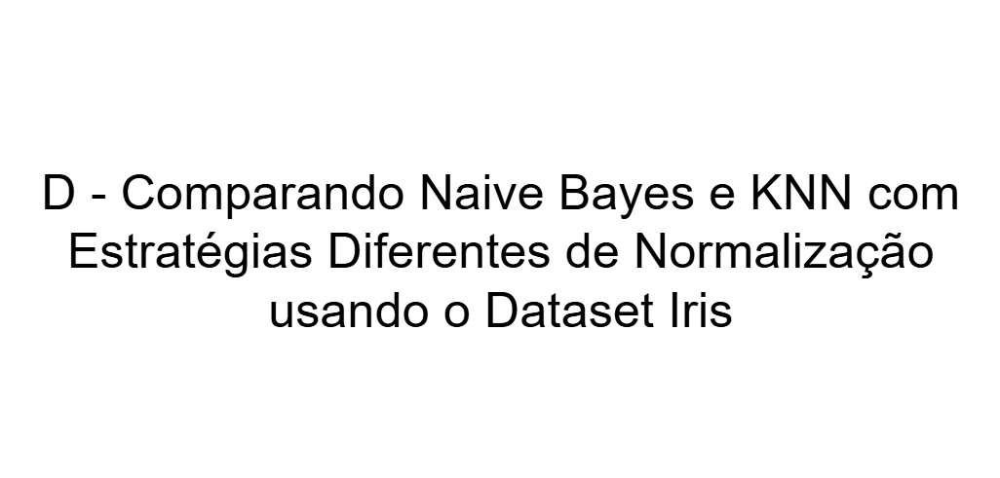

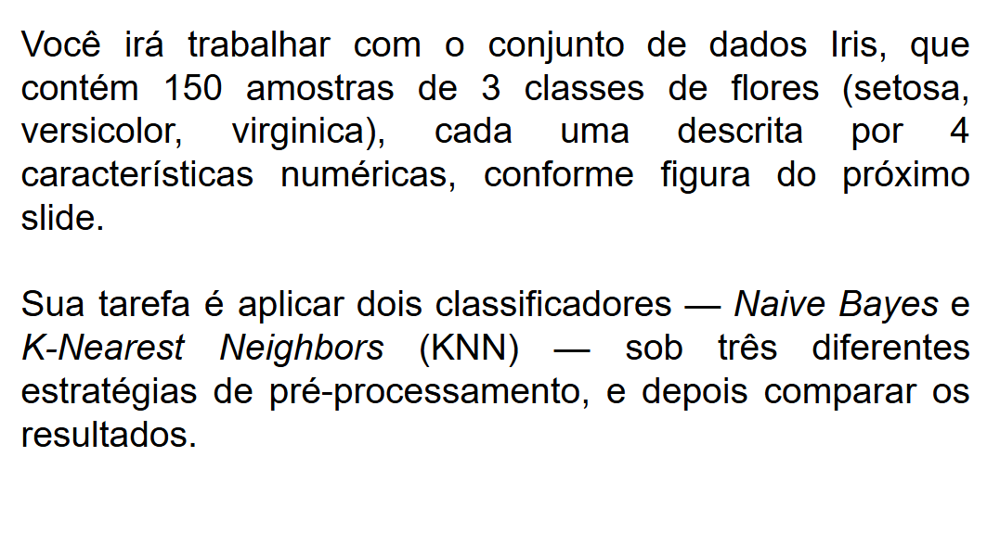

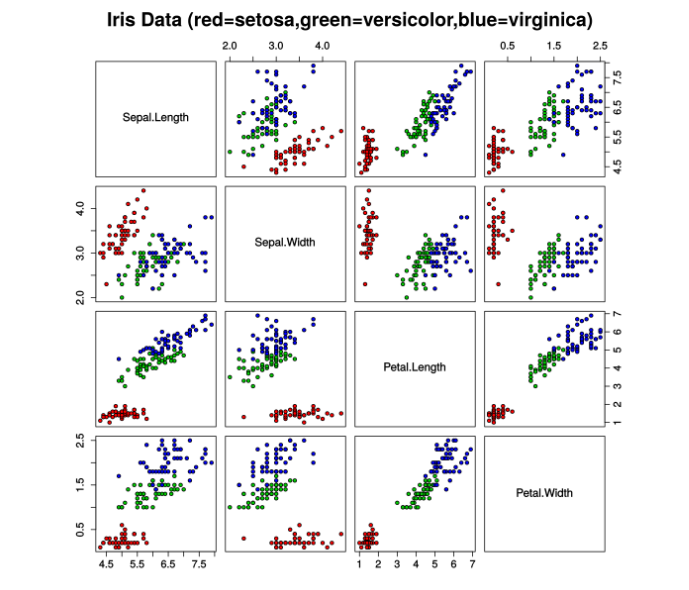

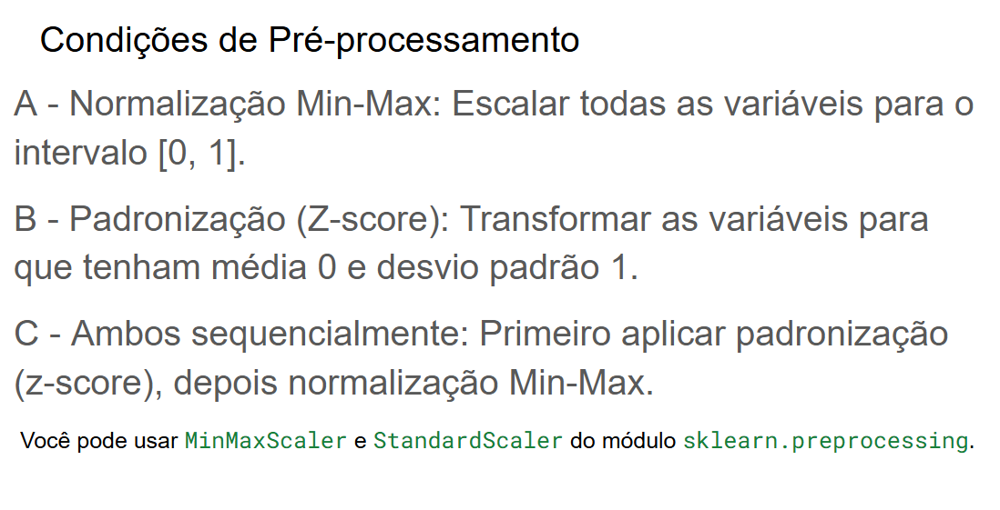

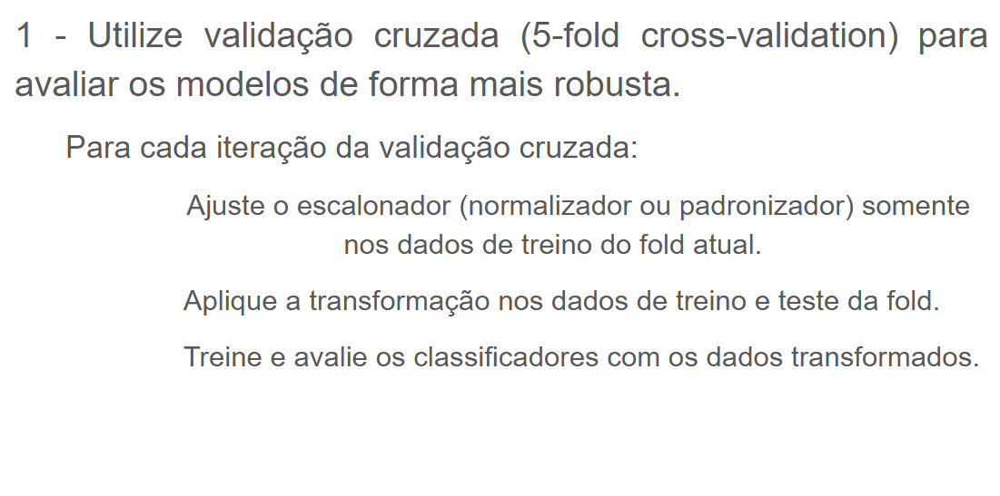

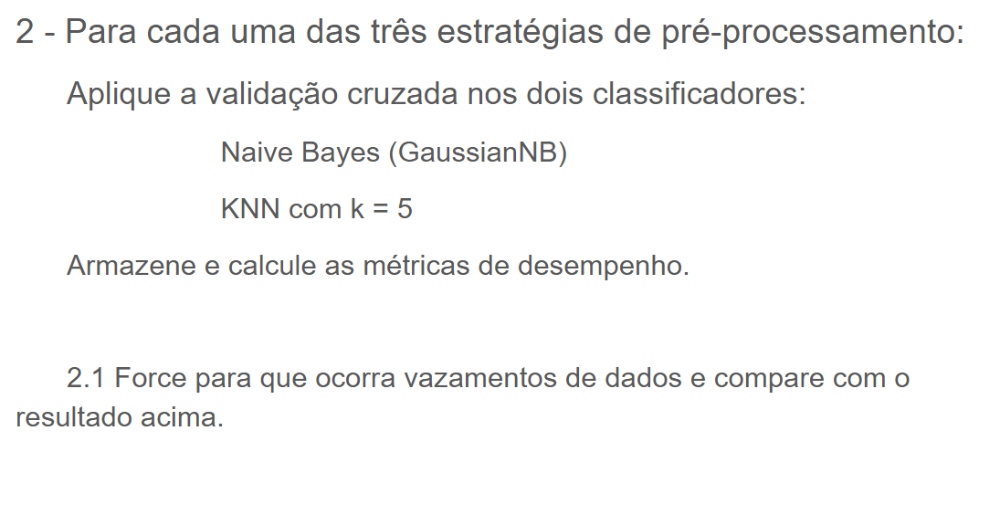

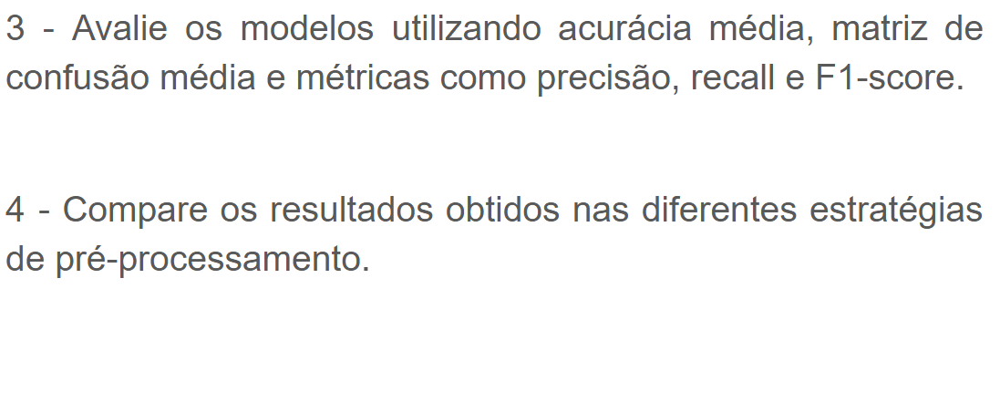

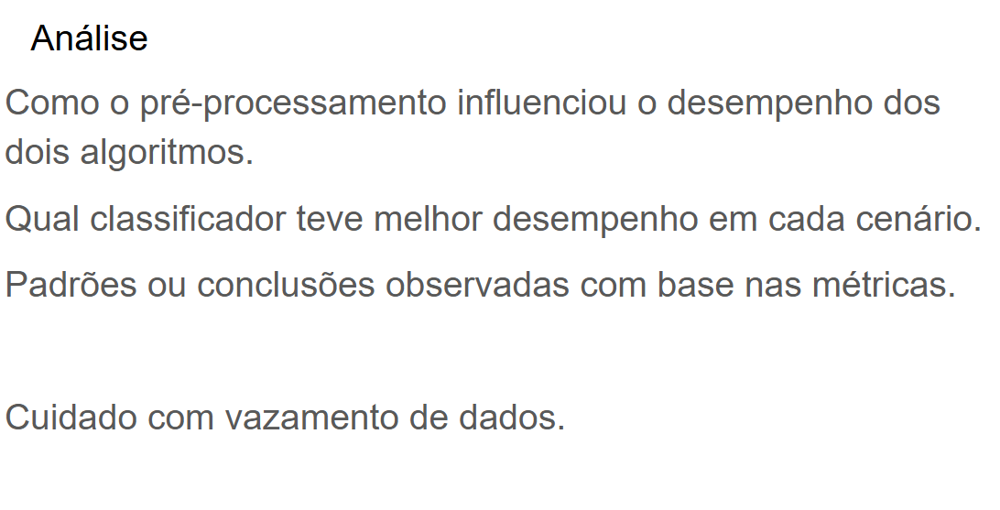

### Normalização
---
A normalização é uma técnica útil de pré-processamento de dados usada para ajustar a escala de características numéricas em dados, de modo que se enquadrem em um intervalo específico ou sigam uma distribuição determinada. Isso é especialmente importante quando os conjuntos de dados contêm características com escalas muito variadas, pois a normalização dos dados ajuda a criar uniformidade entre as características.

Ela transforma os valores em um conjunto de dados em uma escala comum, o que garante que nenhuma característica domine as outras devido à sua magnitude. Sem a normalização, os algoritmos de aprendizado de máquina podem ficar enviesados em relação às características com valores maiores, resultando em previsões distorcidas ou treinamento ineficiente.

Os dois tipos que serão usados:

**Normalização Min-Max**

O escalonamento mínimo-máximo é muitas vezes chamado simplesmente de "normalização". Ele transforma os recursos em um intervalo especificado, normalmente entre 0 e 1. A fórmula para o escalonamento mínimo-máximo é:

$ Xnormalizado = \frac{X - Xmin }{Xmax - Xmin}$

Onde $X$ é um valor de recurso aleatório que deve ser normalizado. $Xmin$ é o valor mínimo do recurso no conjunto de dados, e $Xmax$ é o valor máximo do recurso.

- Quando $X$ é o valor mínimo, o numerador é zero (Xmin - Xmin) e, portanto, o valor normalizado é $0$

- Quando $X$ é o valor máximo, o numerador é igual ao denominador ($Xmax - Xmin$) e, portanto, o valor normalizado é $1$.

- Quando $X$ não é mínimo ou máximo, o valor normalizado está entre $0$ e $1$. Isso é chamado de técnica de escalonamento mínimo-máximo.

**Normalização Z-Score**

A normalização (padronização) do escore $Z$ pressupõe uma distribuição gaussiana (curva de sino) dos dados e transforma os recursos para que tenham uma média ($μ$) de 0 e um desvio padrão ($σ$) de $1$. A fórmula para a padronização é:

$Z padronizado = \frac{X-μ}{σ}$

Onde,

- ($Z$) é o escore Z.
- ($X$)é o valor do ponto de dados.
- ($μ$) é a média do conjunto de dados.
- ($σ$)é o desvio padrão do conjunto de dados.

Essa técnica é particularmente útil ao lidar com algoritmos que pressupõem dados normalmente distribuídos, como muitos modelos lineares. Ao contrário da técnica de dimensionamento mínimo-máximo, os valores dos recursos não estão restritos a um intervalo específico na técnica de padronização.

Essa técnica de normalização basicamente representa os recursos em termos do número de desvios padrão que se afastam da média.

Basicamente:

A normalização por score-Z, também chamada de padronização, transforma os dados de forma que tenham uma média de 0 e um desvio padrão de 1. Esse processo ajusta os valores dos dados com base em quão distantes eles estão da média, medida em unidades de desvio padrão.


### Vazamento de Dados (Data Leakage)
---
O vazamento de dados no aprendizado de máquina ocorre quando um modelo usa informações durante o treinamento que não estariam disponíveis no momento da previsão. O vazamento faz com que um modelo preditivo pareça preciso até ser implementado em seu caso de uso; então, produzirá resultados imprecisos, levando a tomada de decisão ruim e insights falsos.

O objetivo da modelagem preditiva é criar um modelo de aprendizado de máquina que possa fazer previsões precisas sobre dados futuros do mundo real, que não estão disponíveis durante o treinamento do modelo. Para evitar resultados imprecisos, os modelos não devem ser avaliados com os mesmos dados com os quais são treinados.

Então, normalmente os dados disponíveis são divididos em dois conjuntos: um para treinar o modelo e outro para validar o quão bem o modelo funcionará em dados não vistos.

O vazamento de dados acontece quando dados de fora do conjunto de dados de treinamento são usados para criar o modelo, mas esses dados futuros não estarão disponíveis quando o modelo for usado para previsão.

O modelo terá um bom desempenho em testes e validação, mas quando usado em produção, ele se torna totalmente impreciso.

**Vazamento do alvo:** os modelos incluem dados que não estarão disponíveis quando o modelo for usado para fazer previsões.

Usar informações que não estarão disponíveis durante as previsões do mundo real leva ao overfitting, onde o modelo tem um desempenho excepcionalmente bom em dados de treinamento e validação, mas ruim em produção.

**Contaminação durante treinar-testar:** quando dados de treinamento e validação são usados para criar um modelo, geralmente devido à divisão ou pré-processamento inadequados.

#### Causas de Vazamento

**Contaminação de dados externos:** mesclar conjuntos de dados externos com dados de treinamento pode levar a previsões com viés ou imprecisas, pois os dados externos podem conter informações diretas ou indiretas sobre a variável-alvo.

**Validação cruzada incorreta:** ao realizar a validação cruzada em um conjunto de dados com dados dependentes do tempo, se pontos de dados do futuro forem incluídos, o modelo obterá acesso a informações que não deveria ter, resultando em avaliações excessivamente otimistas.

**Normalização:** as transformações de dados, como o dimensionamento ou a normalização de funcionalidades, quando aplicadas incorretamente aos dados de treinamento e de teste em conjunto, em vez de aplicadas separadamente, levam ao vazamento de dados.

**Erros de pré-processamento de dados:** a divisão de dados incorreta ocorre com o dimensionamento dos dados antes de dividi-los em conjuntos de treinamento e validação ou ao preencher missing values com informações de todo o conjunto de dados.

#### Impacto do Vazamento de Dados

**Generalização ruim para novos dados:** quando os modelos são treinados com informações que não representam o mundo real, eles terão dificuldade em generalizar para os dados não vistos. As previsões sobre novos dados podem ser imprecisas e pouco confiáveis.

**Tomada de decisão com viés:** vieses nos dados vazados correm o risco de distorcer o comportamento do modelo, resultando em decisões injustas e desconectadas dos cenários do mundo real.

**Métricas de desempenho infladas:** o vazamento em modelos de aprendizado de máquina geralmente resulta em modelos que mostram falsamente alta exatidão e precisão.




Codificação:

In [31]:
# Carregar o Dataset
iris = load_iris()
features_iris = iris.data
target_iris = iris.target

In [32]:
KF = KFold(n_splits=5, shuffle=True, random_state=42)

In [33]:
modelos = {"Naive Bayes": GaussianNB(), "KNN (k=5)": KNeighborsClassifier(n_neighbors=5)}

In [34]:
def executar_validacao(X, y, estrategia, vazamento=False):

    resultados = {}

    for nome_modelo, modelo in modelos.items():

        acc_scores = []
        precision_scores = []
        recall_scores = []
        f1_scores = []

        matrizes = []

        for train_index, test_index in KF.split(X):

            X_train = X[train_index]
            X_test = X[test_index]

            y_train = y[train_index]
            y_test = y[test_index]

            if estrategia == "minmax":
                scaler = MinMaxScaler()

                if vazamento:
                    # Erro proposital para causar Data Leakage
                    scaler.fit(X)

                else:
                    scaler.fit(X_train)

                X_train = scaler.transform(X_train)
                X_test = scaler.transform(X_test)

            elif estrategia == "zscore":
                scaler = StandardScaler()

                if vazamento:
                    scaler.fit(X)

                else:
                    scaler.fit(X_train)

                X_train = scaler.transform(X_train)
                X_test = scaler.transform(X_test)

            elif estrategia == "zscore_minmax":
                scaler1 = StandardScaler()
                scaler2 = MinMaxScaler()

                if vazamento:
                    # Vazamento(Leak)
                    scaler1.fit(X)
                    X_scaled = scaler1.transform(X)
                    scaler2.fit(X_scaled)

                else:
                    scaler1.fit(X_train)

                X_train = scaler1.transform(X_train)
                X_test = scaler1.transform(X_test)

                if not vazamento:
                    scaler2.fit(X_train)

                X_train = scaler2.transform(X_train)
                X_test = scaler2.transform(X_test)

            modelo.fit(X_train, y_train)

            y_pred = modelo.predict(X_test)

            # Métricas pedidas e outras formas de avaliação
            acc_scores.append(accuracy_score(y_test, y_pred))
            precision_scores.append(precision_score(y_test, y_pred, average='macro'))
            recall_scores.append(recall_score(y_test, y_pred, average='macro'))
            f1_scores.append(f1_score(y_test, y_pred, average='macro'))
            matrizes.append(confusion_matrix(y_test, y_pred))

        matriz_media = np.mean(matrizes, axis=0)

        resultados[nome_modelo] = {"Acurácia Média": np.mean(acc_scores), "Precisão Média": np.mean(precision_scores), "Recall Médio": np.mean(recall_scores), "F1 Médio": np.mean(f1_scores), "Matriz Média": matriz_media}

    return resultados

In [35]:
estrategias = ["minmax", "zscore", "zscore_minmax"]

In [36]:
print("Sem a presença de Vazamento de Dados: ")

for estrategia in estrategias:

    print(f"\n\nEstratégia: {estrategia}")

    resultados = executar_validacao(
        features_iris,
        target_iris,
        estrategia,
        vazamento=False
    )

    for modelo, metricas in resultados.items():

        print(f"\nModelo: {modelo}")

        for nome_metrica, valor in metricas.items():

            if nome_metrica == "Matriz Média":

                print("\nMatriz de Confusão Média:")
                print(valor)

            else:

                print(f"{nome_metrica}: {valor:.4f}")

Sem a presença de Vazamento de Dados: 


Estratégia: minmax

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]

Modelo: KNN (k=5)
Acurácia Média: 0.9533
Precisão Média: 0.9586
Recall Médio: 0.9538
F1 Médio: 0.9541

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.8  9.2]]


Estratégia: zscore

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]

Modelo: KNN (k=5)
Acurácia Média: 0.9600
Precisão Média: 0.9633
Recall Médio: 0.9594
F1 Médio: 0.9599

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]


Estratégia: zscore_minmax

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[[10.   0.   0.

#### Análise dos Resultados dos procedimentos sem Vazamento de Dados

Os resultados mostram que ambos os classificadores apresentaram desempenho bastante elevado no conjunto de dados Iris dataset Iris, com acurácia próxima de 96% quase todos os cenários.

**Naive Bayes:**

O classificador `scikit-learn GaussianNB` apresentou exatamente os mesmos resultados nas três estratégias de pré-processamento:

- Acurácia: 0.9600
- Precisão: 0.9629
- Recall: 0.9600
- F1-score: 0.9592

Isso indica que o Naive Bayes sofreu poucas mudanças em relação as transformações aplicadas nas features (Características).

Isso acontece porque o `GaussianNB` modela cada atributo utilizando distribuições gaussianas individuais. Como ele trabalha com probabilidades condicionais e não com medidas de distância, mudanças de escala tendem a impactar menos seu desempenho.

**KNN:**

O algoritmo `scikit-learn KNeighborsClassifier` apresentou pequenas variações de acordo com  a técnica de escalonamento.

- Min-Max com acurácia de $0.9533$
- Z-score com acurácia de $0.9600$
- Z-score e Min-Max	com acurácia de $0.9533$

Se pode observar que o melhor desempenho ocorreu na estratégia de Z-score.
Isso ocorre pois o KNN utiliza distância euclidiana para encontrar os vizinhos mais próximos. Quando as variáveis possuem escalas diferentes, algumas features podem acabar dominando o cálculo da distância e isso leva a erros no modelo. A padronização reduz esse problema ao centralizar os dados em média 0 e desvio padrão 1.

**Melhor Desempenho:**

O melhor desempenho do algoritmo de Naives Bayes foi usando a estratégia de Precisão, com um valor de $0.9629$. Quanto ao KNN, seu melhor desempenho foi com a estratégia de Z-score. Acho importante ressaltar, que esses desempenhos melhores não foram muito superiores em relação as outras técnicas, se pode dizer que todas tiveram um desempenho bom.

**Estabilidade:**

O Naive Bayes foi o modelo mais estável pois suas métricas foram idênticas em todos os cenários, senão idênticas, mas com valores muito similares ou muito próximos. A matriz de confusão desse algoritmo foi igual mesmo aplicando diferentes técnicas. Isso demonstra que ele teve baixa sensibilidade ao pré-processamento.

**Sensibilidade:**

O KNN apresentou pequenas oscilações a depender da estratégia usada, houve uma melhora com Z-score, ap passo que uma leve queda com Min-Max e uma queda com Z-score + Min-Max também. É notável, até pela natureza do algoritmo, que ele demonstra uma dependência do pré-processamento devido ao uso do cáclulo de distâncias.




**Análise das Matrizes:**

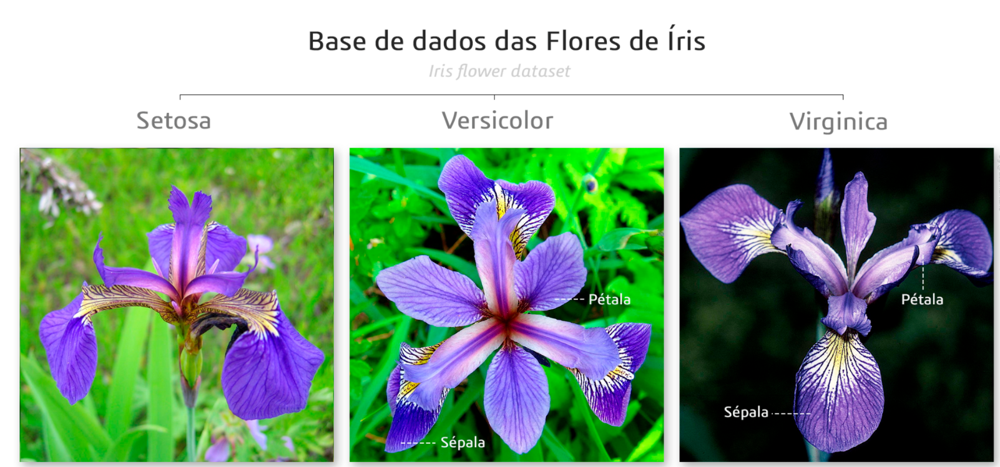

**Classe Setosa:**

Em todos os experimentos:

$[10, 0, 0]$

A classe setosa foi classificada perfeitamente em todos os folds.
Isso acontece porque a Setosa possui características bem marcantes que a difere das demais classes no dataset Iris0.

**Modelo confunde Versicolor e Virginica:**

$[0, 9.4, 0.6]$

$[0, 0.6, 9.4]$

Isso indica que algumas amostras dessas duas flores possuem características muito semelhantes, o que acaba dificultando uma diferenciação eficaz pelos classificadores.


In [37]:
print("Com a presença de Vazamentos de Dados (Data Leakage)")


for estrategia in estrategias:

    print(f"\n\nEstratégia: {estrategia}")

    resultados = executar_validacao(
        features_iris,
        target_iris,
        estrategia,
        vazamento=True
    )

    for modelo, metricas in resultados.items():

        print(f"\nModelo: {modelo}")

        for nome_metrica, valor in metricas.items():

            if nome_metrica == "Matriz Média":

                print("\nMatriz de Confusão Média:")
                print(valor)

            else:

                print(f"{nome_metrica}: {valor:.4f}")

Com a presença de Vazamentos de Dados (Data Leakage)


Estratégia: minmax

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]

Modelo: KNN (k=5)
Acurácia Média: 0.9533
Precisão Média: 0.9586
Recall Médio: 0.9538
F1 Médio: 0.9541

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.8  9.2]]


Estratégia: zscore

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]

Modelo: KNN (k=5)
Acurácia Média: 0.9600
Precisão Média: 0.9633
Recall Médio: 0.9594
F1 Médio: 0.9599

Matriz de Confusão Média:
[[10.   0.   0. ]
 [ 0.   9.4  0.6]
 [ 0.   0.6  9.4]]


Estratégia: zscore_minmax

Modelo: Naive Bayes
Acurácia Média: 0.9600
Precisão Média: 0.9629
Recall Médio: 0.9600
F1 Médio: 0.9592

Matriz de Confusão Média:
[

#### Análise dos Resultados com a presença de Vazamento de Dados

Nos experimentos com vazamento de dados (Data Leakage), os resultados obtidos não foram tão diferentes do experimento feito sem o vazamento de dados. Isso pode ser atribuído ao fato do dataset Iris ter características bem marcantes (caso da flor Setosa), bem distribuídas e relativamente simples para uso na classificação, fazendo com que o impacto do leakage tenha sido pequeno nesse caso específico. Ainda sim, vale ressaltar que o procedimento de permitir o vazamento de dados não é correto, não é recomendável utilizar dados do conjunto de teste que passaram por pré-processamento.

Mesmo assim, metodologicamente o procedimento continua incorreto, pois informações do conjunto de teste foram utilizadas durante o ajuste do pré-processamento.

**Como ocorreu o Vazamento de Dados (Data Leakage):**

O vazamento acabou ocorrendo quando os escalonadores foram ajustados utilizando o dataset completo, com a seguinte função:

`scaler.fit(X)`

Isso ocorreu antes da separação dos Folds, por conta disso os valores de média, desvio padrão, mínimo e máximo foram calculados usando também os dados de teste.

O modelo acabou recebendo informações indiretas sobre o conjunto de avaliação. Basicamente, o modelo aprendeu as propriedades estatísticas de todo o dataset, então a validação cruzada deixou de representar corretamente um cenário real.


# E ) Classificador KNN no Conjunto de Dados Íris usando Curvas ROC e AUC


---



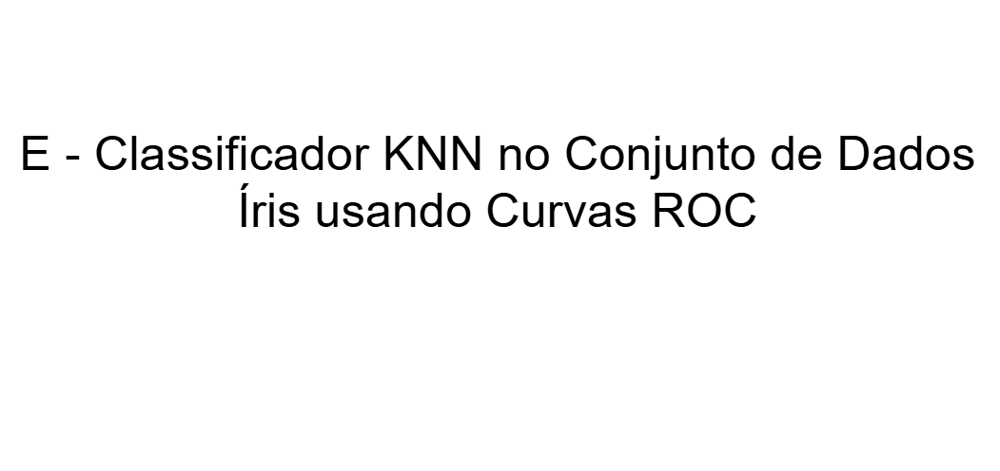

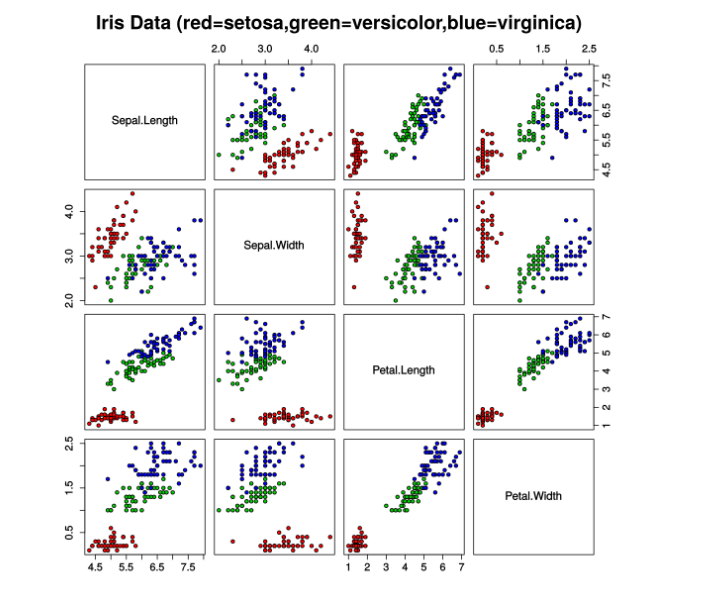

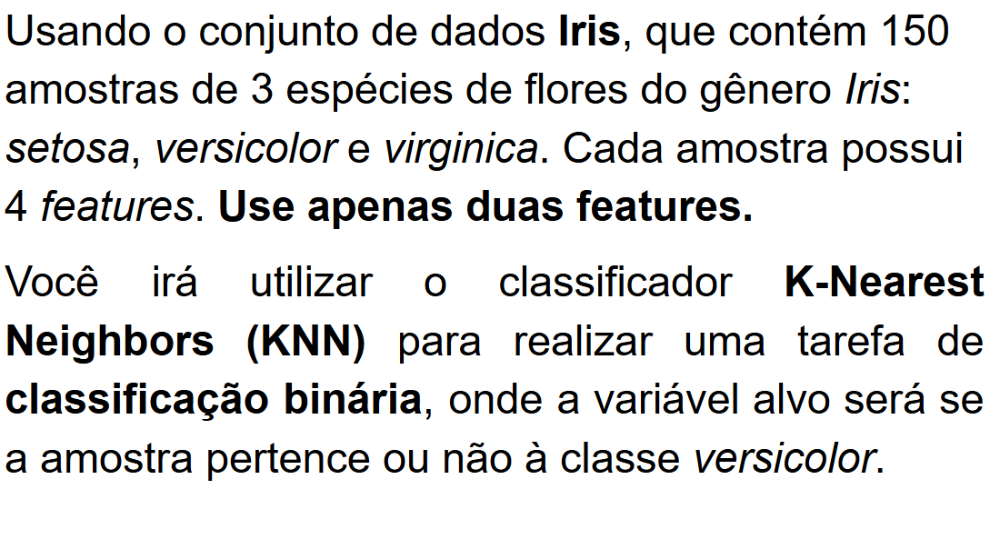

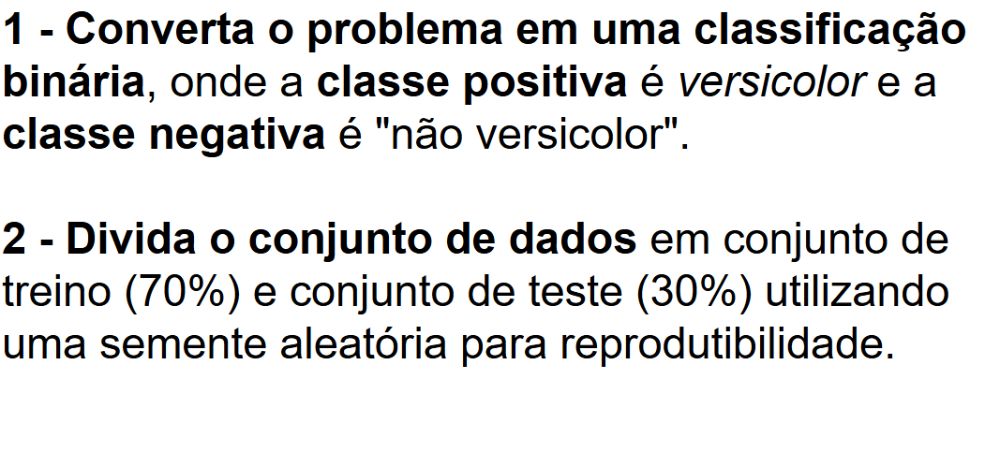

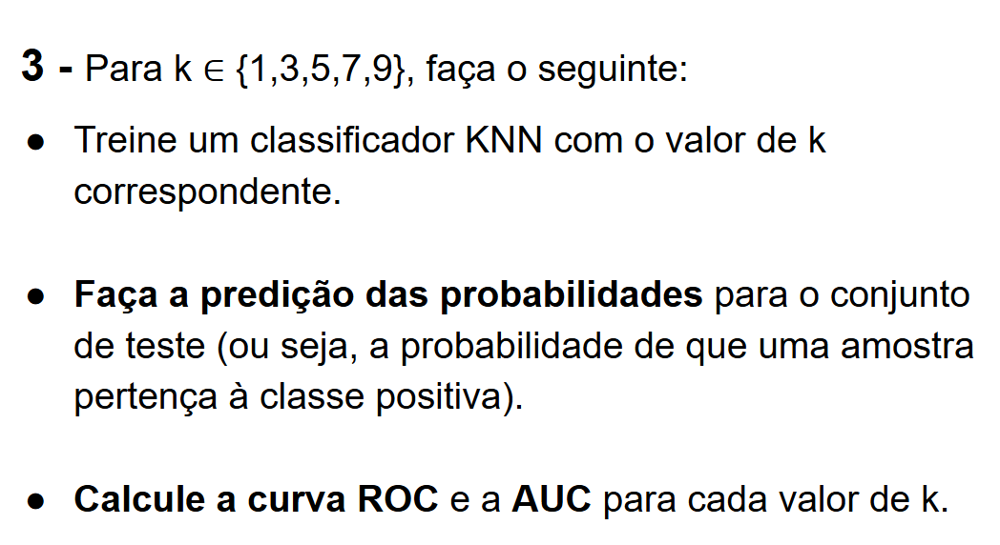

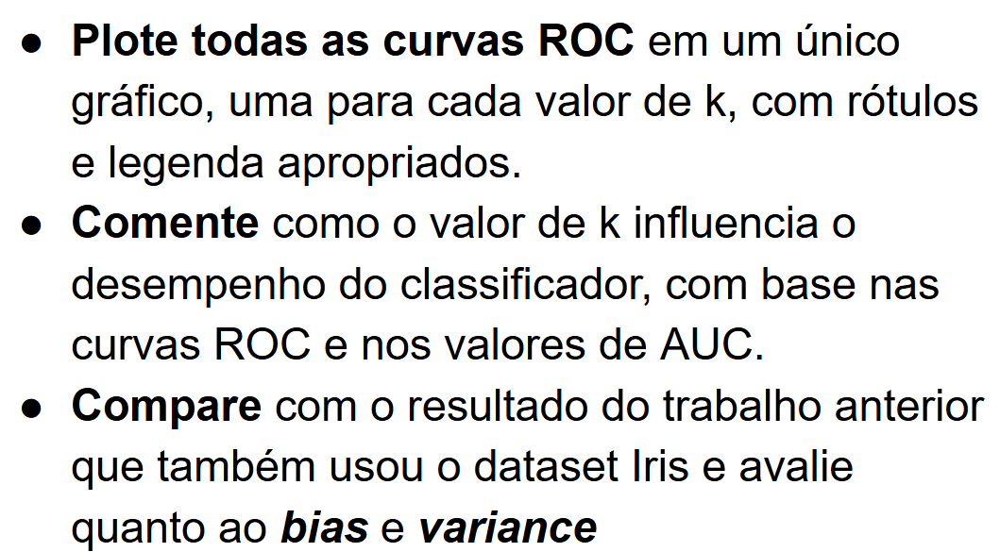

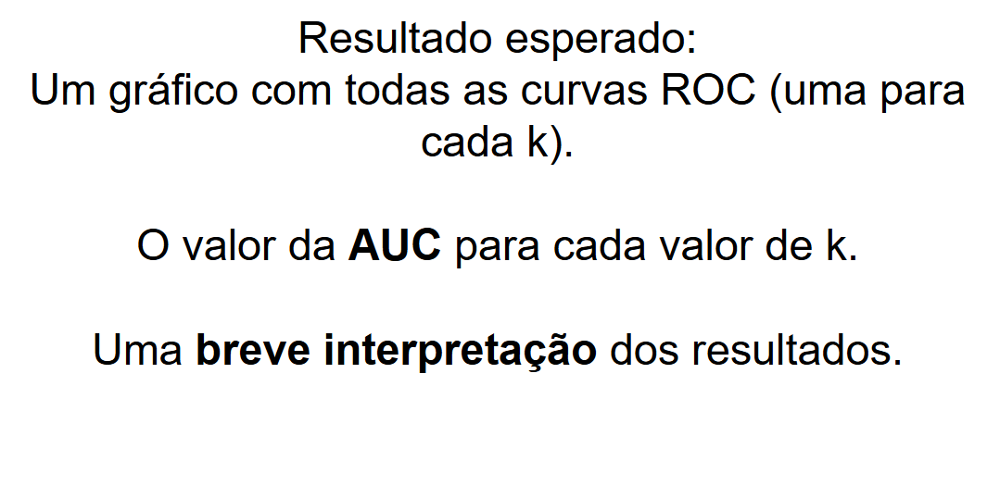

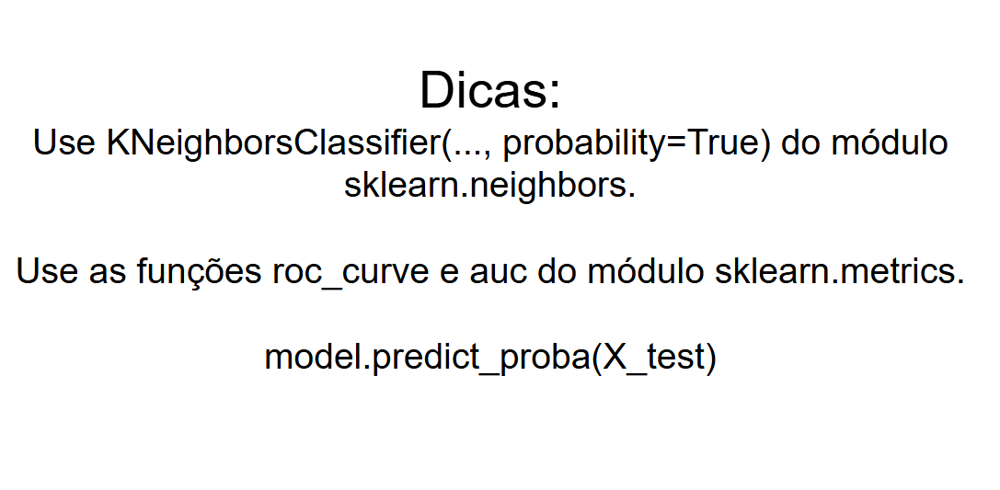

### Taxa de verdadeiro positivo


---


A taxa de verdadeiros positivos, também conhecida como sensibilidade ou recall, reflete a capacidade de um modelo de identificar corretamente as instâncias positivas. Ele mede a proporção de casos positivos reais que o modelo identifica com sucesso. Matematicamente, isso pode ser expresso pela equação a seguir:

$ TPR = \frac{TP}{TP+FN}$

Onde:

- TP ou positivos verdadeiros é o número de registros de classe positivos que o modelo prevê corretamente como positivos.
- FN ou falsos negativos são o número de registros de classes positivas que o modelo prevê incorretamente como negativos.



### Taxa de falsos positivos


---


O FPR representa a frequência com que nosso modelo classifica incorretamente as instâncias de classe negativa como positivas. Ele mede a proporção de instâncias negativas reais que são incorretamente identificadas como positivas pelo modelo, indicando a taxa de alarmes falsos. Em termos matemáticos, isso pode ser expresso da seguinte forma.

$FPR = \frac{FP}{FP+TN}$

Onde:

- FP ou falsos positivos é o número de registros de classes negativas que são incorretamente previstos como positivos.
- TN ou negativos verdadeiros é o número de registros de classe negativa que são corretamente previstos como negativos.

### AUC


---


A AUC (Area Under the Curve) é uma métrica usada em classificação binária para avaliar a capacidade de um modelo em distinguir entre as classes positiva e negativa. Ela representa a área sob a curva ROC (Receiver Operating Characteristic), que plota a taxa de verdadeiros positivos contra a taxa de falsos positivos em diferentes limiares de decisão.

A AUC é a probabilidade de que um exemplo positivo sorteado aleatoriamente tenha um score maior do que um exemplo negativo sorteado aleatoriamente.

Da seguinte forma:

AUC = $1$ → modelo perfeito.

AUC = $0.5$ → modelo aleatório (sem poder de discriminação).

Quanto maior a AUC, melhor o modelo em ordenar exemplos positivos antes dos negativos.

### Overfitting


---


No campo do aprendizado de máquina, o overfitting se manifesta quando um algoritmo se adapta excessivamente ou até mesmo de forma exata aos dados de treinamento, levando a um modelo que não consegue fazer previsões ou conclusões precisas com outros dados que não sejam os dados de treinamento.

O overfitting anula o propósito do modelo de aprendizado de máquina. Quando algoritmos de aprendizado de máquina são construídos, eles aproveitam um conjunto de dados de amostra para treinar o modelo.

Entretanto, quando o modelo é treinado por um período prolongado nos dados de amostra ou quando o modelo é excessivamente complexo, ele pode começar a aprender o "ruído", ou seja, informações irrelevantes, dentro do conjunto de dados.

Quando o modelo memoriza o ruído e se adapta excessivamente ao conjunto de treinamento, ele se torna "overfitted" e não consegue generalizar bem para novos dados. Se um modelo não puder generalizar bem para novos dados, ele não será capaz de executar as tarefas de classificação ou previsão para as quais se destina.

### Underfitting


---


O underfitting ocorre quando um modelo é simples demais, o que pode ser causado por tempo de treinamento insuficiente, poucas funcionalidades de entrada ou regularização excessiva.

Assim como o overfitting, um modelo com underfitting não consegue identificar a tendência dominante nos dados, o que resulta em erros durante o treinamento e baixo desempenho do modelo. Se um modelo não puder generalizar bem para novos dados, ele não poderá ser aproveitado para tarefas de classificação ou previsão.

In [38]:
# Carregando o data set
iris = load_iris()

# Features das flores
feature_iris = iris.data

# Classes do Problema:
# 0 -> setosa
# 1 -> versicolor
# 2 -> virginica

target_iris = iris.target

# Separando as features que vou usar: Sepal Length e Sepal Width
feature_iris = feature_iris[:, [0, 1]]
# Converte todas as classes que não sejam a Versicolor em 0
target_iris = (target_iris == 1).astype(int)

In [39]:
# Divisão em Treino e Teste: conjunto de treino (70%) e conjunto de teste (30%)
features_iris_train, features_iris_test, target_iris_train, target_iris_test = train_test_split(feature_iris, target_iris, test_size=0.3, random_state=42, stratify=target_iris)

[0 1]
[0 1]

K = 1
AUC = 0.5667

K = 3
AUC = 0.7122

K = 5
AUC = 0.7611

K = 7
AUC = 0.7867

K = 9
AUC = 0.7667


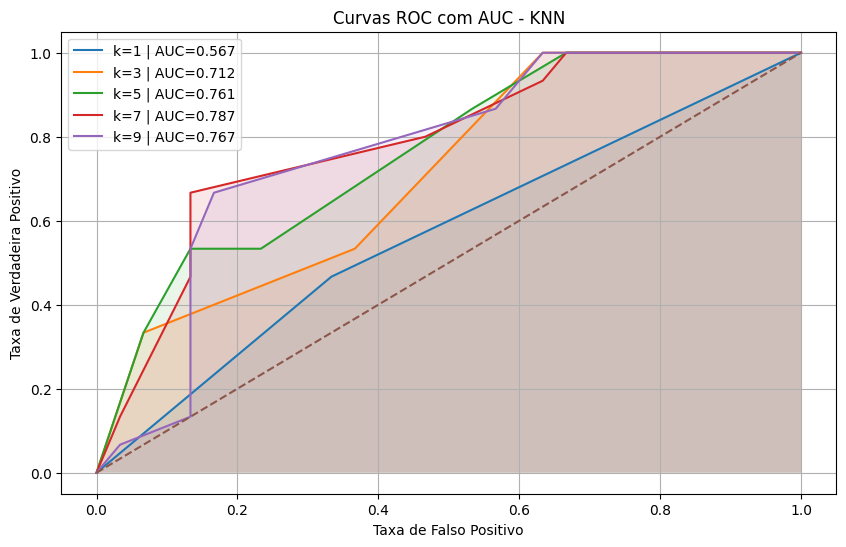

In [61]:
# Conjunto de Valores K(Número de Vizinhos do KNN)
k_n = [1, 3, 5, 7, 9]

# Gráfico
plt.figure(figsize = (10,6))

print(np.unique(target_iris_train))
print(np.unique(target_iris_test))

for n in k_n:
    knn = KNeighborsClassifier(n_neighbors=n)
    knn.fit(features_iris_train, target_iris_train)
    versicolor_prob = knn.predict_proba(features_iris_test)[:, 1]

    fpr, tpr, thresholds = roc_curve(target_iris_test, versicolor_prob)

    roc_auc = auc(fpr, tpr)

    print(f"\nK = {n}")
    print(f"AUC = {roc_auc:.4f}")

    plt.plot(fpr, tpr, label=f'k={n} | AUC={roc_auc:.3f}')
    plt.fill_between(fpr, tpr, alpha=0.1)

plt.plot([0, 1], [0, 1], linestyle='--')

# Configurações do gráfico
plt.xlabel("Taxa de Falso Positivo")
plt.ylabel("Taxa de Verdadeira Positivo")
plt.title("Curvas ROC com AUC - KNN")
plt.legend()
plt.grid(True)

plt.show()

### Interpretação dos Resultados
---
Observando os valores de AUC obtidos a partir das curvas ROC, percebe-se que valores muito baixos de k produziram desempenho inferior, enquanto valores intermediários proporcionaram melhor capacidade de separação entre as classes.

Com $k=1$, o modelo apresentou AUC igual a $0.5667$, indicando desempenho relativamente fraco. Nesse caso, o classificador torna-se extremamente sensível aos exemplos individuais do conjunto de treino, o que aumenta a variância do modelo e favorece overfitting. Assim, pequenas variações ou ruídos nos dados podem impactar fortemente as decisões do classificador.

À medida que o valor de $k$ aumentou para 3, 5 e 7, houve crescimento progressivo do AUC, atingindo o melhor resultado em $k=7$, com AUC igual a $0.7867$. Isso indica que o modelo passou a tomar decisões mais estáveis, considerando um número maior de vizinhos antes de definir a classe de uma amostra. Como consequência, as curvas ROC aproximaram-se mais do canto superior esquerdo do gráfico, demonstrando melhora na capacidade discriminativa do classificador.

Quando o valor foi aumentado para $k=9$, ocorreu uma pequena redução do AUC para $0.7667$. Isso sugere que valores muito altos de k podem tornar o modelo excessivamente generalista, reduzindo sua sensibilidade às características locais dos dados. Nesse cenário, o classificador começa a sofrer de underfitting, perdendo parte da capacidade de distinguir corretamente as classes.

De forma geral, os resultados mostram que existe um equilíbrio importante na escolha do número de vizinhos no KNN. Valores muito baixos tornam o modelo sensível demais ao ruído, enquanto valores muito altos suavizam excessivamente as fronteiras de decisão. Para esse conjunto de dados, o melhor desempenho foi obtido com k=7, indicando um bom equilíbrio entre generalização e sensibilidade aos padrões presentes nos dados.

### Influência dos valores de K nas curvas ROC e AUC


---


O valor de k no classificador k-NN influencia o desempenho de forma diretamente observável pelas curvas ROC e pelos valores de AUC. Quando k é muito pequeno, como k igual a 1, o modelo se torna sensível a ruídos e outliers, produzindo uma curva ROC cheia de degraus e uma AUC alta no treinamento, mas que costuma cair na validação por overfitting.

Conforme k aumenta para um valor intermediário e ideal, a curva ROC se torna mais suave e atinge a maior área sob a curva, indicando a melhor capacidade de separação entre as classes.

Já quando k é muito grande, o modelo fica excessivamente suavizado, aproximando-se de um classificador que ignora a estrutura local dos dados; a curva ROC se aproxima da diagonal e a AUC cai, podendo chegar perto de 0,5, ou seja, desempenho aleatório. Portanto, a escolha de k controla o equilíbrio entre viés e variância, e o melhor valor é aquele que maximiza a AUC na curva ROC de validação.

### Comparação


---

Comparando os resultados atuais de ROC e AUC com os resultados da letra D, observa-se que o valor de k influencia diretamente o equilíbrio entre bias e variance no `scikit-learn KNN`. Na questão anterior, foi utilizada validação cruzada e classificação multiclasse, o modelo com $k=5$ apresentou métricas estáveis e acurácia próxima de $96\%$, indicando bom equilíbrio entre generalização e estabilidade.

Já nos resultados atuais, os valores de AUC variaram bastante conforme o valor de $k$. Com $k=1$, o modelo apresentou baixa AUC, caracterizando alta variância e sensibilidade excessiva aos dados de treino. Conforme k aumentou para $3$, $5$ e $7$, a AUC melhorou, mostrando redução da variância e melhor capacidade de discriminação entre as classes. Em $k=9$, houve pequena queda da AUC, indicando aumento excessivo do viés(bias). Assim, os resultados mostram que valores intermediários de $k$, especialmente $k=7$, produziram o melhor equilíbrio entre bias e variance, maximizando o desempenho do classificador.

# F ) Curva ROC

---



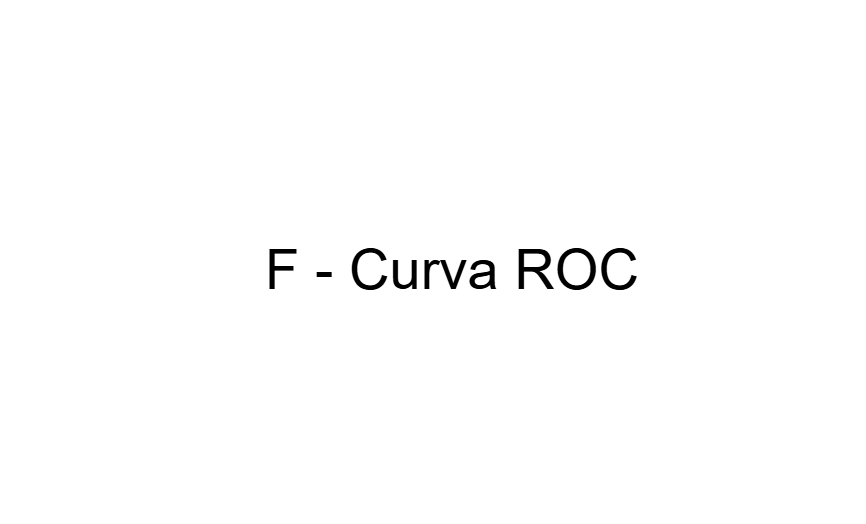

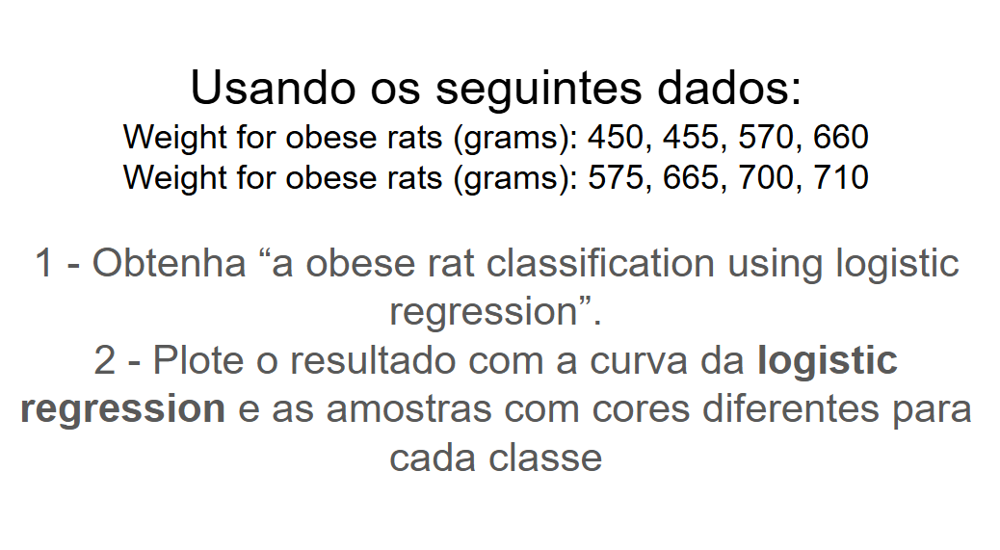

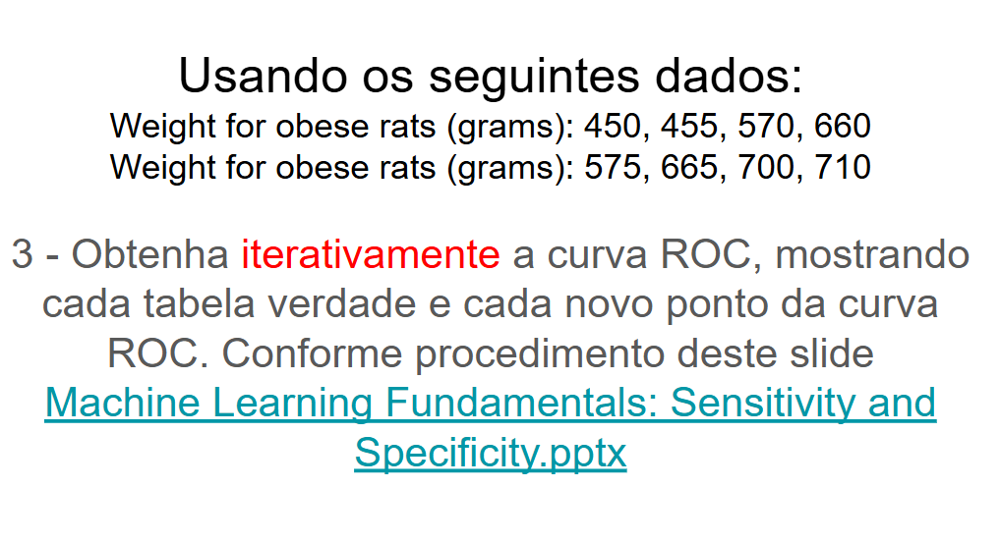

### Regressão Logística
---
A regressão logística, como a regressão linear, é um tipo de modelo linear que examina a relação entre variáveis preditoras (variáveis independentes) e uma variável de saída (a variável de resposta, variável-alvo ou variável dependente). A principal diferença é que a regressão linear é usada quando a saída é um valor contínuo. A regressão logística é usada quando o resultado é categórico.

Na regressão logística, o modelo prevê a probabilidade de ocorrência de um resultado específico. A saída do modelo é um valor entre $0$ e $1$. Com base em um limite (frequentemente $0.5$), classificamos o resultado como "aprovado" ou "não aprovado". Em vez de traçar uma linha reta através dos dados como faríamos na regressão linear, a regressão logística ajusta uma curva em forma de S para mapear valores de entrada para uma probabilidade.



### ROC (Característica de Operação do Receptor)

A curva ROC é uma representação visual da performance do modelo em todos os limites. A versão longa do nome, característica de operação do receptor, é uma retenção da detecção de radar da Segunda Guerra Mundial.

A curva ROC é desenhada calculando a taxa de verdadeiros positivos (TPR, na sigla em inglês) e a taxa de falsos positivos (FPR, na sigla em inglês) em todos os limites possíveis (na prática, em intervalos selecionados) e, em seguida, representando a TPR em relação à FPR. Um modelo perfeito, que em algum limite tem um TPR de $1.0$ e um FPR de $0.0$, pode ser representado por um ponto em $(0, 1)$ se todos os outros limites forem ignorados.

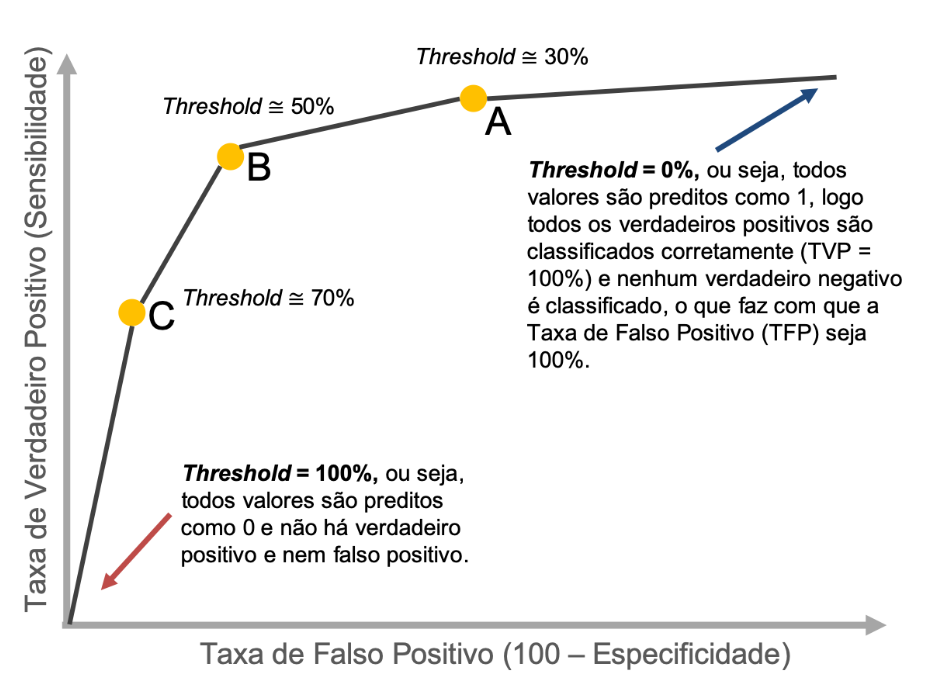

In [41]:
# Dados dos Ratos
# Divide em classes de ratos normais e ratos obesos
features = np.array([450, 455, 570, 660, 575, 665, 700, 710]).reshape(-1,1)
target = np.array([0, 0, 0, 0, 1, 1, 1, 1])
# Dados de Teste
features_t = np.array([587, 596, 625, 723, 432]).reshape(-1, 1)
target_t = np.array([0, 0, 1, 1, 0])

In [42]:
# Treinando o Modelo usando a função do Sklearn
modelo = LogisticRegression()
modelo.fit(features, target)

LogisticRegression()

In [43]:
# Testando o Modelo usando outra base de dados e Visualizando
teste = modelo.predict(features_t)
probs = modelo.predict_proba(features_t)

df_resultado = pd.DataFrame({"Peso:": features_t.flatten(), "Classe": target_t, "Classe Prevista": teste})

df_resultado.T

,0,1,2,3,4
Peso:,587,596,625,723,432
Classe,0,0,1,1,0
Classe Prevista,0,0,1,1,0


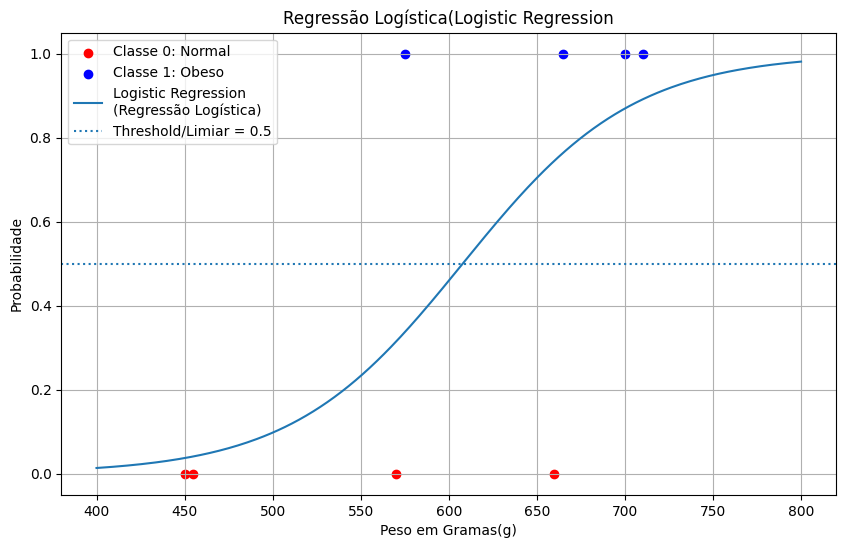

In [44]:
tipo0 = target == 0
tipo1 = target == 1

plt.figure(figsize=(10, 6))

plt.scatter(features[tipo0], target[tipo0], label="Classe 0: Normal", color='red')

plt.scatter(features[tipo1], target[tipo1], label="Classe 1: Obeso", color='blue')


x_curva = np.linspace(400, 800, 300).reshape(-1,1)
y_prob = modelo.predict_proba(x_curva)[:,1]
plt.plot(x_curva, y_prob, label="Logistic Regression\n(Regressão Logística)")

plt.axhline(y=0.5, linestyle=":", label="Threshold/Limiar = 0.5")

plt.xlabel("Peso em Gramas(g)")

plt.ylabel("Probabilidade")

plt.title("Regressão Logística(Logistic Regression")

plt.legend()
plt.grid(True)
plt.show()

### Curva ROC

---



In [45]:
# Threshold
limiar = 0.5
# Dados
probabilidades = modelo.predict_proba(features)[:,1]
predicoes = (probabilidades >= limiar).astype(int)

In [46]:
# Modelo
matriz = confusion_matrix(target, predicoes)
TN, FP, FN, TP = matriz.ravel()

In [47]:
TPR = TP / (TP + FN)

FPR = FP / (FP + TN)

In [48]:
# Dados
thresholds = [0.0, 0.2, 0.4, 0.5, 0.6, 0.8, 1.0]
m_tp = []
m_fp = []

# Funções
y_prob = modelo.predict_proba(features)[:,1]

for threshold in thresholds:

    print(f"\nThreshold = {threshold}")

    predicoes = (y_prob >= threshold).astype(int)

    print("Predições:")
    print(predicoes)

    matriz = confusion_matrix(target, predicoes)

    print("\nMatriz de Confusão:")
    print(matriz)

    TN, FP, FN, TP = matriz.ravel()
    TPR = TP / (TP + FN)
    FPR = FP / (FP + TN)

    m_tp.append(TPR)
    m_fp.append(FPR)

    print(f"\nTPR = {TPR:.2f}")

    print(f"FPR = {FPR:.2f}")

    print(f"Ponto ROC = ({FPR:.2f}, {TPR:.2f})")


Threshold = 0.0
Predições:
[1 1 1 1 1 1 1 1]

Matriz de Confusão:
[[0 4]
 [0 4]]

TPR = 1.00
FPR = 1.00
Ponto ROC = (1.00, 1.00)

Threshold = 0.2
Predições:
[0 0 1 1 1 1 1 1]

Matriz de Confusão:
[[2 2]
 [0 4]]

TPR = 1.00
FPR = 0.50
Ponto ROC = (0.50, 1.00)

Threshold = 0.4
Predições:
[0 0 0 1 0 1 1 1]

Matriz de Confusão:
[[3 1]
 [1 3]]

TPR = 0.75
FPR = 0.25
Ponto ROC = (0.25, 0.75)

Threshold = 0.5
Predições:
[0 0 0 1 0 1 1 1]

Matriz de Confusão:
[[3 1]
 [1 3]]

TPR = 0.75
FPR = 0.25
Ponto ROC = (0.25, 0.75)

Threshold = 0.6
Predições:
[0 0 0 1 0 1 1 1]

Matriz de Confusão:
[[3 1]
 [1 3]]

TPR = 0.75
FPR = 0.25
Ponto ROC = (0.25, 0.75)

Threshold = 0.8
Predições:
[0 0 0 0 0 0 1 1]

Matriz de Confusão:
[[4 0]
 [2 2]]

TPR = 0.50
FPR = 0.00
Ponto ROC = (0.00, 0.50)

Threshold = 1.0
Predições:
[0 0 0 0 0 0 0 0]

Matriz de Confusão:
[[4 0]
 [4 0]]

TPR = 0.00
FPR = 0.00
Ponto ROC = (0.00, 0.00)


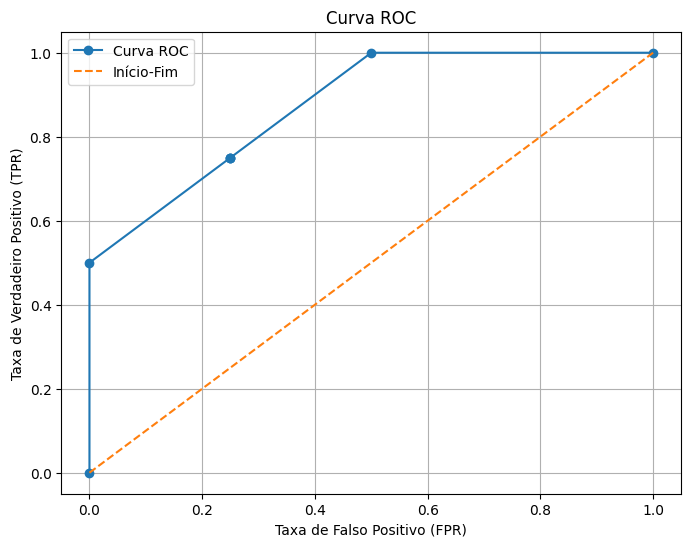

In [53]:
plt.figure(figsize=(8,6))

plt.plot(m_fp, m_tp, marker='o', label="Curva ROC")

# linha aleatória
plt.plot([0,1], [0,1], linestyle='--', label="Início-Fim")

plt.xlabel("Taxa de Falso Positivo (FPR)")

plt.ylabel("Taxa de Verdadeiro Positivo (TPR)")

plt.title("Curva ROC")

plt.legend()

plt.grid(True)

plt.show()

A curva ROC foi construída variando o threshold entre $0.0$ e $1.0$, permitindo observar como o comportamento do classificador muda conforme o critério de decisão se torna mais rígido ou mais flexível. Nos thresholds mais baixos, o modelo tende a classificar praticamente todas as amostras como positivas, aumentando bastante a sensibilidade, mas também elevando a quantidade de falsos positivos.

Isso pode ser observado no threshold $0.0$, no qual todas as amostras foram classificadas como positivas, resultando em TPR igual a $1.00$ e FPR igual a 1.00. Nesse caso, o modelo conseguiu identificar todos os positivos corretamente, porém falhou completamente em distinguir as classes negativas.

Thresholds (Limiares) menores aumentam a capacidade de detectar positivos, mas também elevam os erros sobre as classes negativas, enquanto thresholds maiores reduzem falsos positivos ao custo de perder parte dos verdadeiros positivos. Os resultados indicam que o modelo acaba por possuir capacidade razoável de separação entre as classes, especialmente na faixa intermediária dos limiares (thresholds), onde houve melhor equilíbrio entre sensibilidade e especificidade.

# G ) Naive Bayes e Spam

---



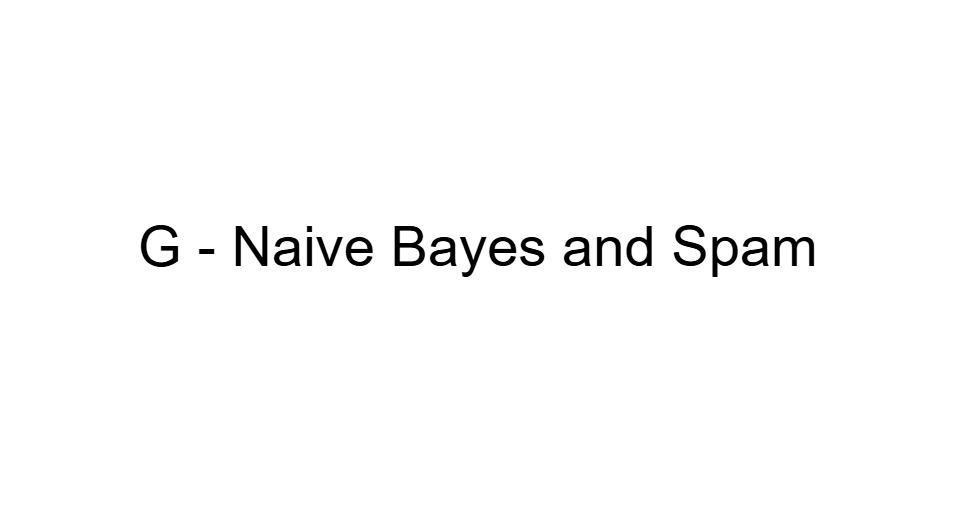

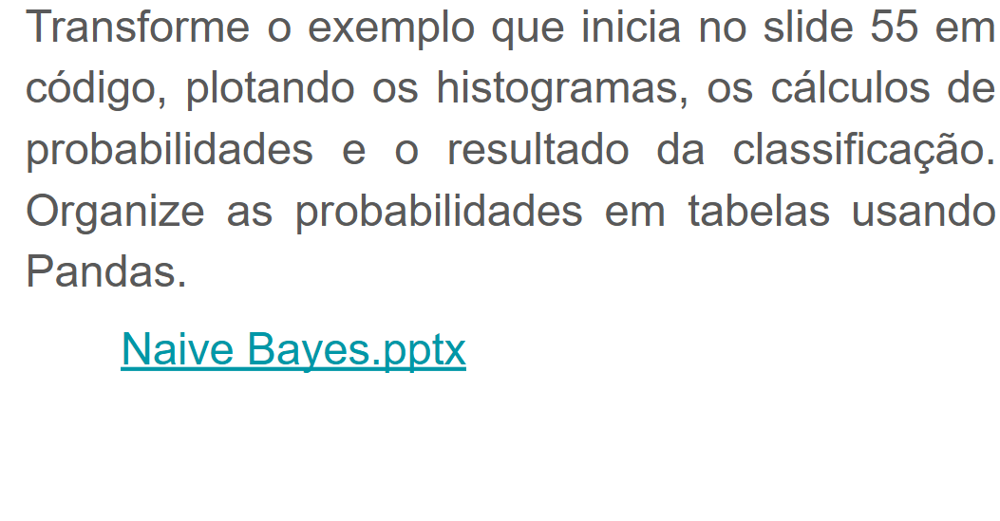

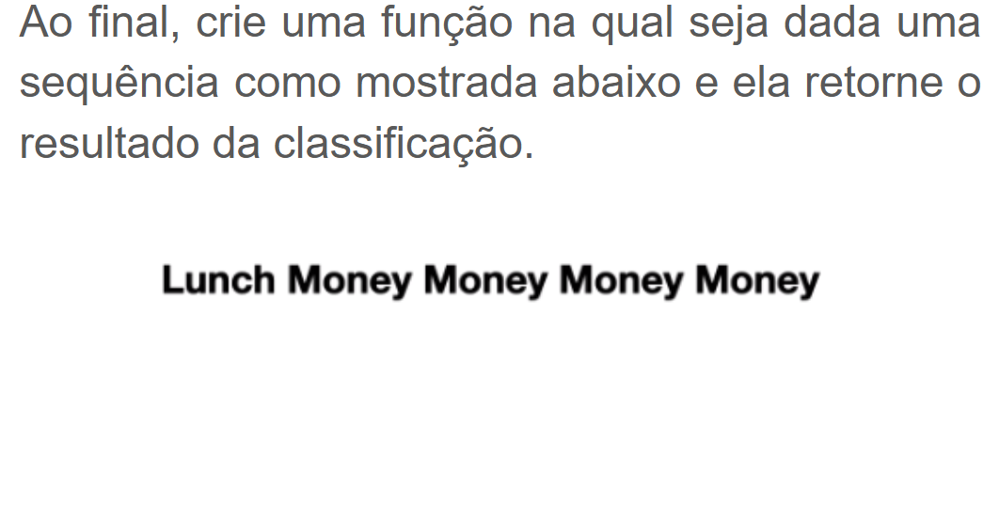

### A probabilidade das palavras em mensagens normais:


In [ ]:
# Palavras
palavras = ["dear", "friend", "lunch", "money"]

# Frequências
frequencias = [8, 5, 3, 1]

# Criando gráfico de barras
plt.bar(palavras, frequencias)

# Título e rótulos
plt.title("Frequência das Palavras em Email Normal")
plt.xlabel("Palavras")
plt.ylabel("Frequência")

# Exibir gráfico
plt.show()

In [ ]:
dados = {"palavra": ["dear", "friend", "lunch", "money"], "frequencia": [8, 5, 3, 1], "total": [17]*4}

email_normal = pd.DataFrame(dados)

email_normal["probabilidade"] = email_normal["frequencia"] / email_normal["total"]

email_normal

### A probabilidade das palavras em mensagens de spam:

In [ ]:
# Palavras
palavras = ["dear", "friend", "lunch", "money"]

# Frequências
frequencias = [2, 1, 0, 4]

# Criando gráfico de barras
plt.bar(palavras, frequencias)

# Título e rótulos
plt.title("Frequência das Palavras em Email de Spam")
plt.xlabel("Palavras")
plt.ylabel("Frequência")

# Exibir gráfico
plt.show()

In [ ]:
dados = {"palavra": ["dear", "friend", "lunch", "money"], "frequencia": [2, 1, 0, 4], "total": [7]*4}

email_spam = pd.DataFrame(dados)

email_spam["probabilidade"] = email_spam["frequencia"] / email_spam["total"]

email_spam

### Após isso, se retiram os histogramas e usa-se somente as probabilidades obtidas, usando um exemplo onde é preciso classificar uma mensagem, dado que foram recebidas 12 mensagens, sendo 8 delas normais e 4 de spam:

Classificar: "Dear Friend"

In [ ]:
probabilidade_normal = 8/12

prob_dear = email_normal.loc[email_normal["palavra"] == "dear", "probabilidade"].values[0]
prob_friend = email_normal.loc[email_normal["palavra"] == "friend", "probabilidade"].values[0]

resultado_N = probabilidade_normal * prob_dear * prob_friend

print(resultado_N)

In [ ]:
probabilidade_spam = 4/12

prob_dear = email_spam.loc[email_spam["palavra"] == "dear", "probabilidade"].values[0]
prob_friend = email_spam.loc[email_spam["palavra"] == "friend", "probabilidade"].values[0]

resultado_S = probabilidade_spam * prob_dear * prob_friend

print(resultado_S)

Comparando os resultados:

In [ ]:
if (resultado_N > resultado_S):
    print("A sequência de palavras é normal")
else:
    print("A sequência de palavras é spam")

### Ocorrência que leva ao uso de Black Box:


Classificar: Lunch Money Money Money Money

In [ ]:
prob_lunch = email_normal.loc[email_normal["palavra"] == "lunch", "probabilidade"].values[0]
prob_money = email_normal.loc[email_normal["palavra"] == "money", "probabilidade"].values[0]

resultado_N = (
    probabilidade_normal
    * prob_lunch
    * prob_money
    * prob_money
    * prob_money
    * prob_money
)

print(f"{resultado_N:.8f}")

In [ ]:
prob_lunch = email_spam.loc[email_spam["palavra"] == "lunch", "probabilidade"].values[0]
prob_money = email_spam.loc[email_spam["palavra"] == "money", "probabilidade"].values[0]

resultado_N = (
    probabilidade_spam
    * prob_lunch
    * prob_money
    * prob_money
    * prob_money
    * prob_money
)

print(f"{resultado_N}")

Apesar de ser uma mensagem muito estranha, ela não é classificada com Spam, visto que a probabilidade da palavra lunch em Spam é zero, então sempre é considerado como um email normal. Para evitar esse tipo de anomalia, se usa Black Box, que consiste em adicionar uma ocorrência de palavra em todas as frequências para previnir que ocorram problemas similares.  

### Novos histogramas:

In [ ]:
# Palavras
palavras = ["dear", "friend", "lunch", "money"]

# Frequências
frequencias = [9, 6, 4, 2]

# Criando gráfico de barras
plt.bar(palavras, frequencias)

# Título e rótulos
plt.title("Frequência das Palavras em Email Normal")
plt.xlabel("Palavras")
plt.ylabel("Frequência")

# Exibir gráfico
plt.show()

In [ ]:
# Palavras
palavras = ["dear", "friend", "lunch", "money"]

# Frequências
frequencias = [3, 2, 1, 5]

# Criando gráfico de barras
plt.bar(palavras, frequencias)

# Título e rótulos
plt.title("Frequência das Palavras em Email de Spam")
plt.xlabel("Palavras")
plt.ylabel("Frequência")

# Exibir gráfico
plt.show()

Bem como novos valores de probabilidade:

In [ ]:
dados = {"palavra": ["dear", "friend", "lunch", "money"], "frequencia": [9, 6, 4, 2], "total": [21]*4}

email_normal = pd.DataFrame(dados)

email_normal["probabilidade"] = email_normal["frequencia"] / email_normal["total"]

email_normal

In [ ]:
dados = {"palavra": ["dear", "friend", "lunch", "money"], "frequencia": [3, 2, 1, 5], "total": [11]*4}

email_spam = pd.DataFrame(dados)

email_spam["probabilidade"] = email_spam["frequencia"] / email_spam["total"]

email_spam

Agora é possível observar que a palavra lunch não tem probabilidade de $0\%$ no spam, agora refazendo os cálculos:

In [ ]:
# Probabilidade dessa palavra ser uma Mensagem Normal:
prob_lunch = email_normal.loc[email_normal["palavra"] == "lunch", "probabilidade"].values[0]
prob_money = email_normal.loc[email_normal["palavra"] == "money", "probabilidade"].values[0]

resultado_N = (probabilidade_normal * prob_lunch * prob_money * prob_money * prob_money * prob_money)

print(f"{resultado_N:.8f}")

In [ ]:
# Probabilidade dessa palavra ser uma Mensagem de Spam:
prob_lunch = email_spam.loc[email_spam["palavra"] == "lunch", "probabilidade"].values[0]
prob_money = email_spam.loc[email_spam["palavra"] == "money", "probabilidade"].values[0]

resultado_N = (probabilidade_spam * prob_lunch * prob_money * prob_money * prob_money * prob_money)

print(f"{resultado_N}")

Reanalisando os dados, se pode notar agora que o valor do Spam é maior, então a mensagem é classificada como Spam. Apesar disso, é importante salientar que o Naive Bayes (Bayes Ingênuo) funciona de forma "ingênua", isto é, ele não usa contexto, a ordem das palavras não importa, apenas a frequência delas.

### Função que recebe uma Sequência e retorna o resultado:

In [ ]:
# Função que recebe uma sequência de palavras

# Probabilidades de Spam e de Normal
spam_probs = { "dear": 3/11, "friend": 2/11, "lunch": 1/11, "money": 5/11}
normal_probs = { "dear": 9/21, "friend": 6/21, "lunch": 4/21, "money": 2/21}

# Função

def classificar(mensagem):
    sequencia = mensagem.split()

    probabilidade_normal = 8/12
    probabilidade_spam = 4/12

    for palavra in sequencia:
        probabilidade_normal *= normal_probs[palavra]
        probabilidade_spam *= spam_probs[palavra]

    print(f"Normal: {probabilidade_normal:.30f}")
    print(f"Spam: {probabilidade_spam:.30f}")

    if probabilidade_normal > probabilidade_spam:
        print(f"A mensagem '{mensagem}' é Normal!")
    else:
        print(f"A mensagem '{mensagem}' é Spam!")

In [ ]:
# Teste com uma sequencia de palavras
classificar("friend friend lunch money money dear")

# H ) Gauss Naive Bayes

---



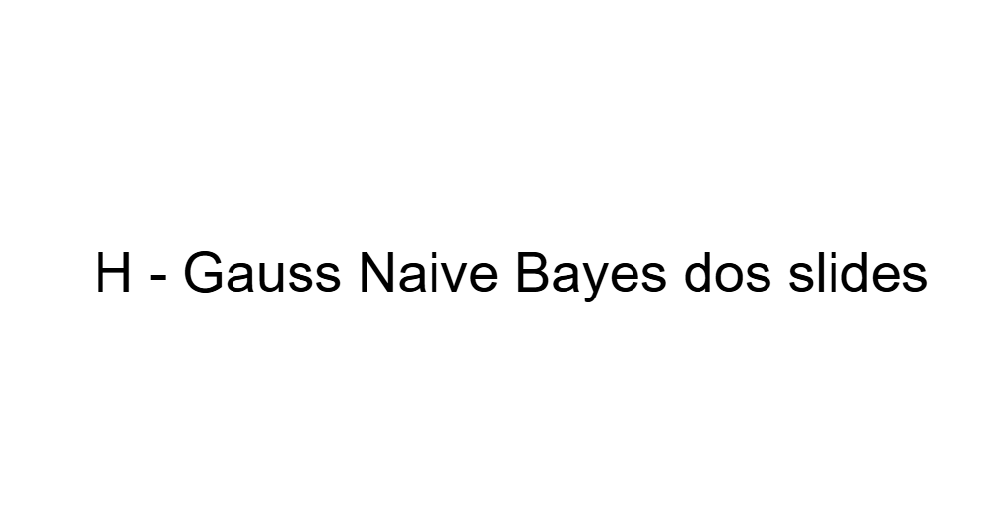

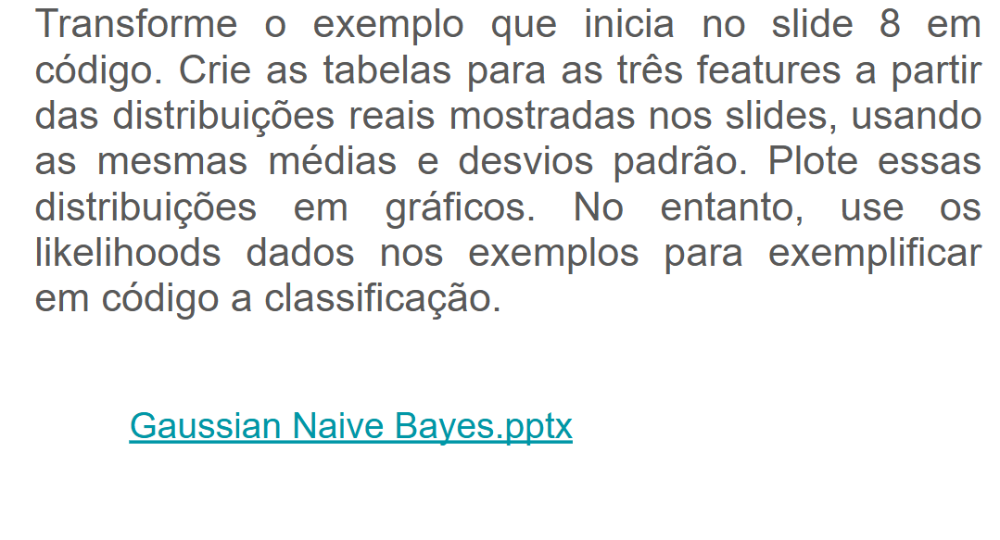

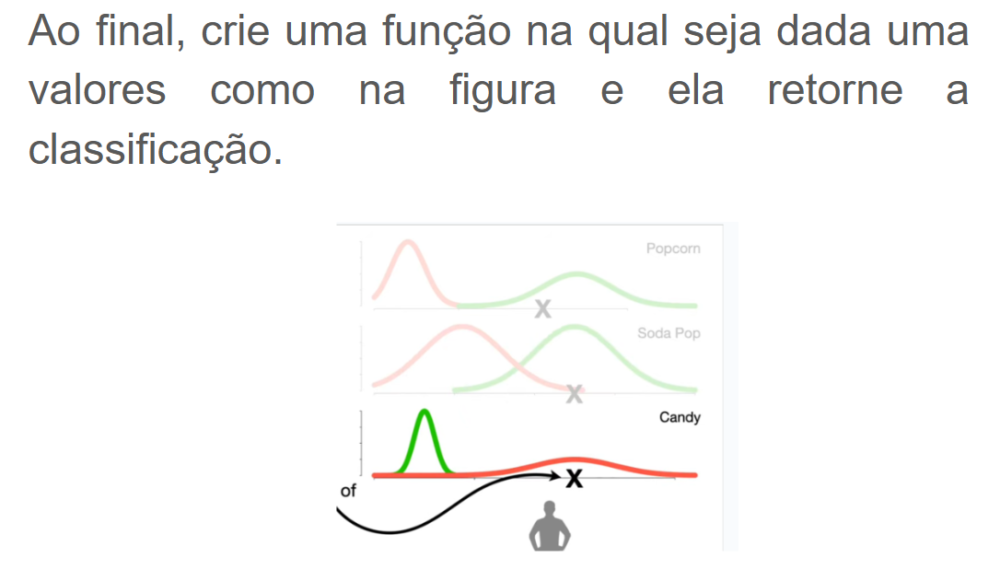

In [67]:
# Tabela de Features de quem não gosta desse filme
# Classe 0 = Odeia Troll 2
# Pipoca   -> média = 4   | desvio padrão aproximadamente = 2
# Coca     -> média = 220 | desvio padrão aproximadamente = 100
# Doce     -> média = 100 | desvio padrão aproximadamente = 20
odeia_Troll_2 = pd.DataFrame({
    "Popcorn": [
        2.1, 4.8, 3.9, 5.1, 1.7, 6.2, 4.3, 2.8, 3.1, 5.7,
        4.6, 1.9, 2.5, 6.5, 3.3, 4.9, 5.4, 2.2, 3.8, 4.1,
        2.7, 5.0, 3.4, 4.5, 1.5, 6.1, 3.7, 2.9, 5.3, 4.0,
        3.2, 5.8, 2.4, 4.7, 1.8, 6.0, 3.5, 2.6, 5.6, 4.2
    ],

    "SodaPop": [
        120.5, 110.9, 180.0, 250.0, 300.0, 200.0, 150.0, 275.0, 350.0, 225.0,
        190.0, 400.0, 100.0, 275.0, 240.0, 260.0, 180.0, 210.0, 320.0, 230.0,
        170.0, 290.0, 205.0, 245.0, 130.0, 360.0, 220.0, 195.0, 310.0, 215.0,
        185.0, 330.0, 140.0, 255.0, 115.0, 380.0, 200.0, 175.0, 295.0, 225.0
    ],

    "Candy": [
        90.7, 102.3, 110.0, 95.0, 120.0, 85.0, 100.0, 105.0, 115.0, 92.0,
        108.0, 98.0, 20,  27, 99.0, 101.0, 112.0, 23, 107.0, 96.0,
        89.0, 118.0, 103.0, 97.0, 122.0, 84.0, 109.0, 91.0, 114.0, 95.0,
        100.0, 119.0, 86.0, 104.0, 93.0, 123.0, 99.0, 88.0, 111.0, 97.0
    ],
    "Classe": 0 })

# Tabela de Features de quem Gosta desse filme
# Classe 1 = Ama Troll 2
# Pipoca  -> média = 24  | desvio padrão aproximadamente = 4
# Coca    -> média = 500 | desvio padrão aproximadamente = 100
# Doce    -> média = 25  | desvio padrão aproximadamente = 5
ama_Troll_2 = pd.DataFrame({
    "Popcorn": [
        24.3, 28.2, 22.5, 26.1, 20.4, 25.7, 23.8, 29.0, 27.3, 21.9,
        24.8, 26.5, 19.7, 30.1, 22.8, 25.2, 27.0, 23.1, 28.5, 24.9,
        26.8, 21.5, 29.3, 24.1, 22.2, 27.6, 23.5, 30.4, 25.0, 20.9,
        28.0, 24.6, 26.2, 22.7, 29.8, 23.9, 25.5, 27.1, 21.8, 28.7
    ],

    "SodaPop": [
        750.7, 533.2, 620.0, 480.0, 550.0, 700.0, 510.0, 450.0, 610.0, 530.0,
        490.0, 680.0, 520.0, 470.0, 560.0, 590.0, 430.0, 640.0, 575.0, 505.0,
        660.0, 495.0, 710.0, 540.0, 460.0, 625.0, 515.0, 735.0, 555.0, 485.0,
        695.0, 525.0, 605.0, 475.0, 720.0, 500.0, 570.0, 650.0, 445.0, 680.0
    ],

    "Candy": [
        0.2, 50.5, 22.0, 18.0, 30.0, 25.0, 27.0, 15.0, 35.0, 20.0,
        28.0, 24.0, 12.0, 32.0, 19.0, 26.0, 21.0, 29.0, 17.0, 23.0,
        14.0, 31.0, 18.0, 27.0, 16.0, 34.0, 20.0, 11.0, 25.0, 22.0,
        30.0, 19.0, 28.0, 13.0, 36.0, 24.0, 17.0, 26.0, 15.0, 29.0
    ],
    "Classe": 1 })

In [ ]:
ama_Troll_2.T

In [ ]:
print(f"Média de Pipoca: {ama_Troll_2["Popcorn"].mean()}")
print(f"Desvio de Padrão da Pipoca: {ama_Troll_2["Popcorn"].std()}\n")

print(f"Média da Coca: {ama_Troll_2["SodaPop"].mean()}")
print(f"Desvio de Padrão da Coca: {ama_Troll_2["SodaPop"].std()}\n")

print(f"Média do Doce: {ama_Troll_2["Candy"].mean()}")
print(f"Desvio de Padrão do Doce: {ama_Troll_2["Candy"].std()}\n")

In [ ]:
odeia_Troll_2.T

In [ ]:
print(f"Média de Pipoca: {odeia_Troll_2["Popcorn"].mean()}")
print(f"Desvio de Padrão da Pipoca: {odeia_Troll_2["Popcorn"].std()}\n")

print(f"Média da Coca: {odeia_Troll_2["SodaPop"].mean()}")
print(f"Desvio de Padrão da Coca: {odeia_Troll_2["SodaPop"].std()}\n")

print(f"Média do Doce: {odeia_Troll_2["Candy"].mean()}")
print(f"Desvio de Padrão do Doce: {odeia_Troll_2["Candy"].std()}\n")

### Gráficos da Distribuições de cada Feature

In [ ]:
def plotar_distribuicao(feature):

    # Classe 0
    media_0 = odeia_Troll_2[feature].mean()
    desvio_0 = odeia_Troll_2[feature].std()

    # Classe 1
    media_1 = ama_Troll_2[feature].mean()
    desvio_1 = ama_Troll_2[feature].std()

    # eixo X
    menor = min(
        odeia_Troll_2[feature].min(),
        ama_Troll_2[feature].min()
    ) - 10

    maior = max(
        odeia_Troll_2[feature].max(),
        ama_Troll_2[feature].max()
    ) + 10

    x = np.linspace(menor, maior, 1000)

    # distribuições normais
    y0 = norm.pdf(x, media_0, desvio_0)
    y1 = norm.pdf(x, media_1, desvio_1)

    # gráfico
    plt.figure(figsize=(8,5))

    plt.plot(x, y0, label="Classe 0 - Odeia Troll 2")
    plt.plot(x, y1, label="Classe 1 - Ama Troll 2")

    plt.title(f"Distribuição Normal - {feature}")

    plt.xlabel(feature)
    plt.ylabel("Densidade")

    plt.legend()
    plt.grid()

    plt.show()

plotar_distribuicao("Popcorn")
plotar_distribuicao("SodaPop")
plotar_distribuicao("Candy")

### Classificação: Exemplo

---
Seguindo com o exemplo, se usa uma Probabilidade a Priori (Prior Probability), basicamente um chute inicial. Definindo um número de 7 pessoas que viram esse filme, 4 pessoas amaram e 3 pessoas odiaram, a probabilidade inicial de ter gostado é $0.6$ e a probabilidade inicial de ter odiado é $0.4$.


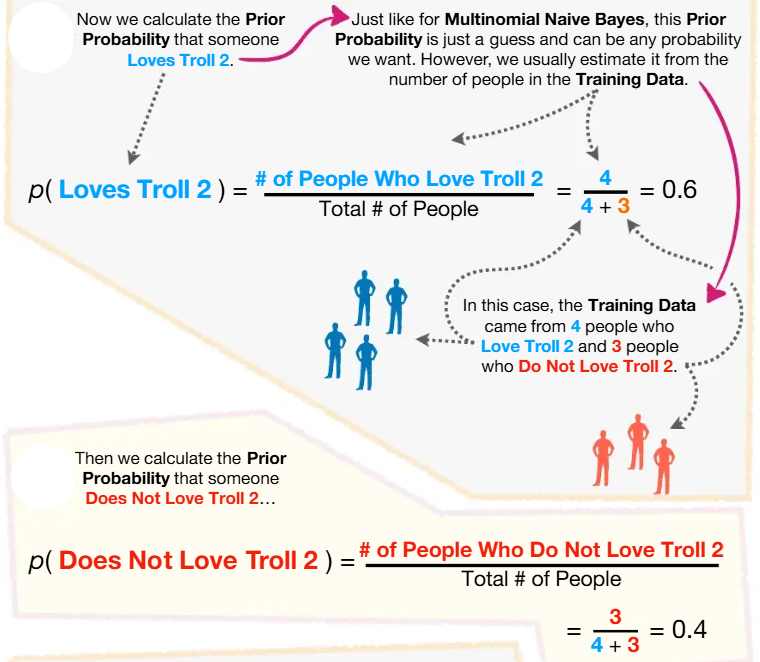

In [ ]:
P_gostou = 0.6
P_odiou = 0.4

Segue-se pelo exemplo da pessoa que comeu 10g de Pipoca, 500 ml de refrigerante e 25g de doce, tudo isso dado que ele amou o filme. Além disso, se obtem os likelihood de Popcorn, Sodapop e Candy: $0.6$, $0.004$ e $0.0000...0001$ (um número muito pequeno).

Como se tem um número muito pequeno, se aplica a função log para evitar erros de underflow (ocorre quando uma operação matemática resulta em um valor tão infinitamente pequeno (próximo de zero) que a memória do computador não tem espaço suficiente para armazená-lo com precisão, forçando o sistema a arredondá-lo para zero).

In [ ]:
Log_pg = math.log(P_gostou)
Log_popcorn_g = math.log(0.06)
Log_sodapop_g = math.log(0.004)
Log_candy_g = math.log(0.00000000000000000000000000000000000000000000000001)
soma_g = Log_pg + Log_popcorn_g + Log_sodapop_g + Log_candy_g
print(f"Score para Amei o Filme: ({Log_pg}) + ({Log_popcorn_g}) + ({Log_sodapop_g}) + ({Log_candy_g}) = {round(soma_g)}")

Segue-se pelo exemplo da pessoa que comeu 10g de Pipoca, 500 ml de refrigerante e 25g de doce, tudo isso dado que ele odiou o filme. Além disso, se obtem os likelihood de Popcorn, Sodapop e Candy: $0.000...0003$ (um  número muito pequeno), $0.000079$ e $0.02$.

In [ ]:
Log_po = math.log(P_odiou)
Log_popcorn_o = math.log(0.000000000000003)
Log_sodapop_o = math.log(0.000079)
Log_candy_o = math.log(0.02)
soma_o = Log_po + Log_popcorn_o + Log_sodapop_o + Log_candy_o
print(f"Score para Odiei o Filme: ({Log_po}) + ({Log_popcorn_o}) + ({Log_sodapop_o}) + ({Log_candy_o}) = {round(soma_o)}")

A partir dos resultados, se pode afirmar que dado o que ela consumiu, é uma pessoa que não gostou do filme, visto que o resultado (Score) de "Odiou o filme" foi o maior em comparação com o de "Amei o filme".

### Classificação: Função

---
Função de classificação que usa a Função de Densidade de Probabilidade para encontrar o Likelihood e prosseguir com os cálculos. Apesar das tentativas, os resultados da tentativa de simulação dos dados presentes na tabela de features original não teve bom progresso, o que dificulta a comparação dos resultados.


In [ ]:
# Função de Densidade de Probabilidade para calcular o Likelihood
def FDP(x, media, desvio):
    expoente = (((x - media) / desvio)**2) * (-0.5)
    denominador = desvio * ((math.pi*2)**0.5)
    return (1 * ((math.e)**expoente)) / denominador

In [ ]:
# Função para Classificar
def classificar(Pipoca, Coca, Doce):

    # Cálculos para Score de "Gostou do Filme"

    g_FDP_popcorn = FDP(Pipoca, ama_Troll_2["Popcorn"].mean(), ama_Troll_2["Popcorn"].std())
    g_FDP_soda = FDP(Coca,ama_Troll_2["SodaPop"].mean(), ama_Troll_2["SodaPop"].std())
    g_FDP_candy = FDP(Doce, ama_Troll_2["Candy"].mean(), ama_Troll_2["Candy"].std())

    g_score = math.log(0.6) + math.log(g_FDP_popcorn) + math.log(g_FDP_soda) + math.log(g_FDP_candy)

    # Cálculos para Score de "Odiei o Filme"

    o_FDP_popcorn = FDP(Pipoca, odeia_Troll_2["Popcorn"].mean(), odeia_Troll_2["Popcorn"].std())
    o_FDP_soda = FDP(Coca, odeia_Troll_2["SodaPop"].mean(), odeia_Troll_2["SodaPop"].std())
    o_FDP_candy = FDP(Doce, odeia_Troll_2["Candy"].mean(), odeia_Troll_2["Candy"].std())

    o_score = math.log(0.4) + math.log(o_FDP_popcorn) + math.log(o_FDP_soda) + math.log(o_FDP_candy)

    if g_score > o_score:
        print(f"Os valores de Pipoca ({Pipoca}g), Coca ({Coca}ml) e Doce ({Doce}g)\nresultam nos scores (Amou: {g_score}) e (Odiou: {o_score}),\nÉ notável pelas pontuações que a pessoa Gostou do filme!")
    else:
        print(f"Os valores de Pipoca ({Pipoca}g), Coca ({Coca}ml) e Doce ({Doce}g)\nresultam nos scores (Odiou: {o_score}) e (Amou: {g_score}),\nÉ notável pelas pontuações que a Odiou o filme!")


In [ ]:
classificar(10, 500, 25)

### Classificação: Função usando valores fixos obtidos

---



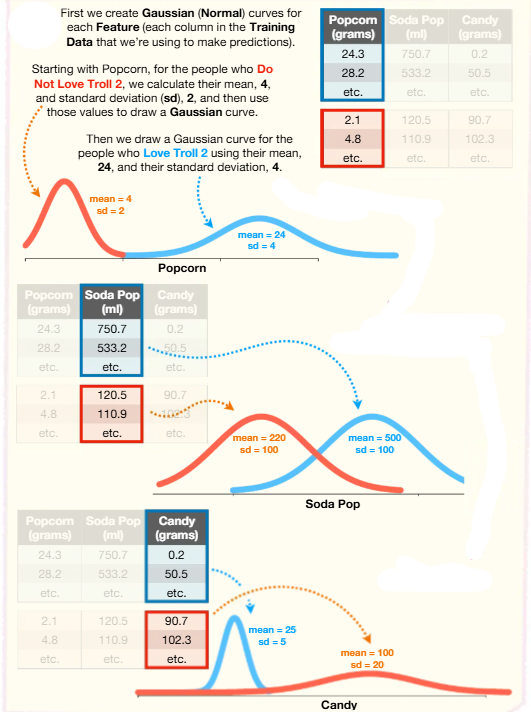

In [ ]:
# Função para Classificar
def classificar(Pipoca, Coca, Doce):

    # Cálculos para Score de "Gostou do Filme"

    g_FDP_popcorn = FDP(Pipoca, 24, 4)
    g_FDP_soda = FDP(Coca, 500, 100)
    g_FDP_candy = FDP(Doce, 25, 5)

    g_score = math.log(0.6) + math.log(g_FDP_popcorn) + math.log(g_FDP_soda) + math.log(g_FDP_candy)

    # Cálculos para Score de "Odiei o Filme"

    o_FDP_popcorn = FDP(Pipoca, 4, 2)
    o_FDP_soda = FDP(Coca, 220, 100)
    o_FDP_candy = FDP(Doce, 100, 20)

    o_score = math.log(0.4) + math.log(o_FDP_popcorn) + math.log(o_FDP_soda) + math.log(o_FDP_candy)

    if g_score > o_score:
        print(f"Os valores de Pipoca ({Pipoca}g), Coca ({Coca}ml) e Doce ({Doce}g)\nresultam nos scores (Amou: {g_score}) e (Odiou: {o_score}),\nÉ notável pelas pontuações que a pessoa Gostou do filme!")
    else:
        print(f"Os valores de Pipoca ({Pipoca}g), Coca ({Coca}ml) e Doce ({Doce}g)\nresultam nos scores (Odiou: {o_score}) e (Amou: {g_score}),\nÉ notável pelas pontuações que a Odiou o filme!")


In [ ]:
classificar(10, 500, 25)

Mesmo usando dados de média e desvio fixos, ainda sim não se apróxima dos resultados obtidos pelo exemplo original.

# I ) Naive Bayes and Iris dataset/Acurácia


---



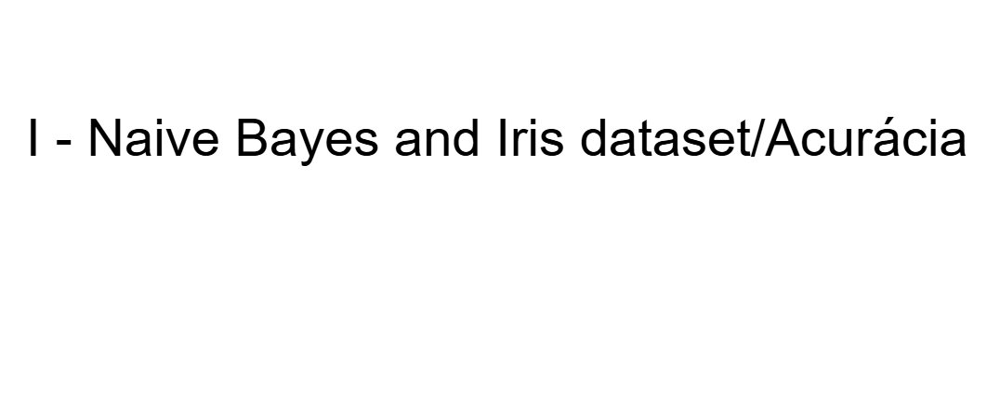

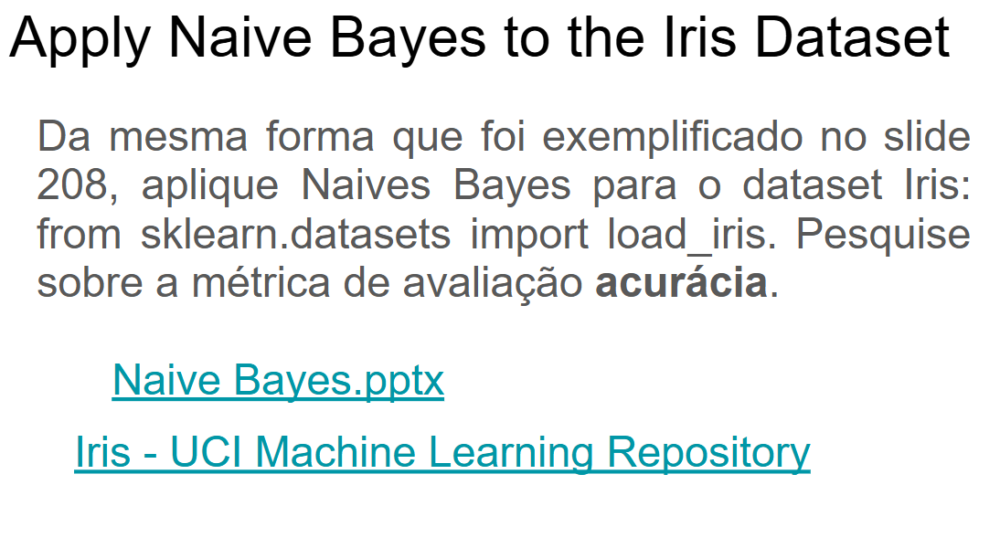

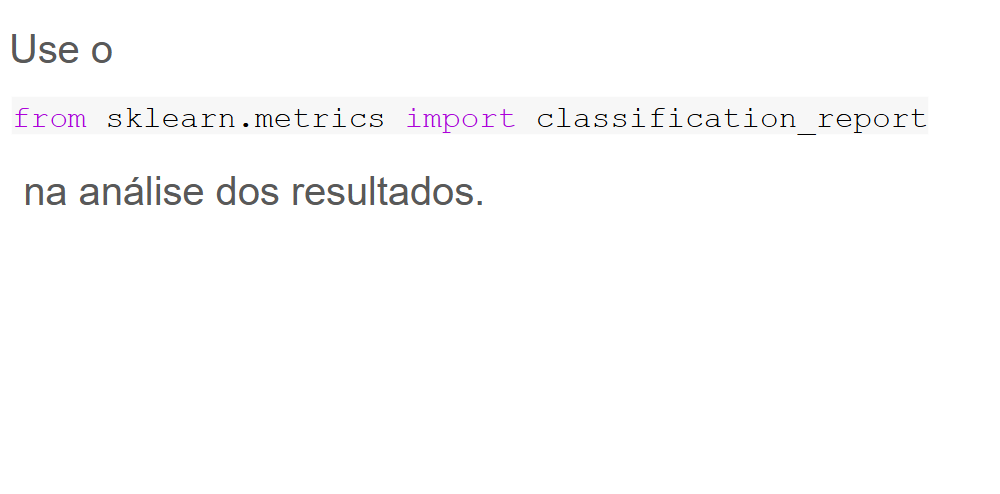

### Acurácia
---
A principal finalidade da acurácia é, justamente, identificar o grau de proximidade em determinada medição ou em algum resultado apresentado por um instrumento de métrica. Assim, ela pode ser utilizada como verificação do nível de exatidão em diferentes processos e sistemas tecnológicos, podendo variar de $0\%$ a $100\%$.

- Nível entre $0\%$ e $30\%$

Em geral, os níveis de acurácia entre $0\%$ e $30\%$ são considerados baixos, indicando que há pouca certeza de que os resultados obtidos correspondem aos valores reais.

É imprescindível evitar soluções com níveis tão mínimos de acurácia.

- Nível entre $30\%$ e $90\%$

Os níveis de acurácia que ficam entre $30\%$ e $90\%$ são considerados médios e representam riscos moderados em relação a resultados não condizentes com os valores reais.

Dependendo da informação a ser validada e do nível de risco que um erro ou equívoco representa, as soluções com esse nível ainda podem ser adotadas.

- Nível de acurácia entre $90\%$ e $100\%$

Esses níveis correspondem a resultados de alta precisão e baixo risco. Esse é o intervalo de acurácia que é ideal.

A partir de um nível de 90% de acurácia, os resultados podem ser considerados aprovados, pois estão menos sujeitos a variações em relação à referência real.

### Explicação do funcionamento:

A função ```load_iris() ``` carrega o dataset (conjunto de dados) na memória.

Essa função retorna um **objeto container expondo chaves como atributos**. Isto é, Eles estendem os dicionários permitindo que os valores sejam acessados por chave, ou por um atributo, isso é uma característica que facilita seu uso.

Ele é usado principalmente para agrupar os conjuntos de dados em um único objeto que contém tanto os dados numéricos quanto as descrições do dataset.



In [54]:
# Carregando o Dataset
iris = load_iris()

In [55]:
# Só exibe os dados de todas as features e as suas classes
# iris

Separação do objeto em duas partes, ```X = iris.data``` pega as características das diferentes flores,

``` y = iris.target``` é onde foram armazenadas as classes das flores.





In [56]:
X = iris.data   # Onde ficam as features(Características das flores)
y = iris.target # Onde fica as classes das flores

A função ```train_test_split``` serve para separar os dados em teste e treino.

A necessidade de separar uma base de dados é porque o modelo precisará ser testado futuramente, esses testes fazem usos dos dados de teste, também ocorre pois se o modelo for treinado e não testado com outra base de informações, ele estará apenas gravando dados e resultados, sem aprender de fato. Quando algo assim ocorre, o modelo se torna infuncional.

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Essa parte implementa o algoritmo Naive Bayes Gaussiano, pois assume que os dados tem distribuição normal.

In [58]:
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

GaussianNB()

In [59]:
y_pred = nb_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      0.92      0.96        13
           2       0.93      1.00      0.96        13

    accuracy                           0.98        45
   macro avg       0.98      0.97      0.97        45
weighted avg       0.98      0.98      0.98        45



A métrica de acurácia obtida pelo classificador` scikit-learn GaussianNB` foi de 0.98, indicando que o modelo classificou corretamente aproximadamente 98% das amostras do conjunto de teste.

Esse resultado demonstra um desempenho bastante elevado no conjunto de dados Iris dataset Iris, mostrando que o algoritmo conseguiu identificar adequadamente as diferentes espécies de flores utilizando apenas as características numéricas fornecidas.

Esse desempenho elevado é de ser esperado no dataset Iris, já que algumas das classes possuem separação relativamente clara no espaço das features, enfâse na classe Setosa, que é identificada com menos dificuldades pelos classificadores por ter características mais diferentes em relação as outros dois tipos de flor.

Dessa forma, a alta acurácia obtida indica que o Naive Bayes apresentou excelente capacidade de classificação nesse problema, sendo eficiente para distinguir as diferentes classes de flores do dataset Iris.